# 1. Chargement du dataset

In [1]:
from pathlib import Path
csv_pvf10 = "../data/processed/structure_pvf_10.csv"
results_dir = "ML_images_results_DenseKeras"
Path(results_dir).mkdir(parents=True, exist_ok=True)

In [2]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Charger le dataframe à partir du dataset
def load_df_from_dataset(csv_path,*,format,originalTrainTest=False,removeCarre=False,validationSet=False):
    # Charger le fichier CSV et filtrer sur le format sélectionné
    df_pvf10 = pd.read_csv(csv_path)
    df_pvf10 = df_pvf10.loc[(df_pvf10['Format'] == format)]
    # Si on utilise le découpage train/test proposé par les créateurs du dataset
    if originalTrainTest:
        df_train = df_pvf10.loc[(df_pvf10['Train_Test'] == 'train')]  
        df_test = df_pvf10.loc[(df_pvf10['Train_Test'] == 'test')] 
        X_train = df_train.drop('Classe',axis=1)
        y_train = df_train['Classe']
        X_test = df_test.drop('Classe',axis=1)
        y_test = df_test['Classe']
    # Sinon si on retire les images carrées mises en doute lors de l'analyse exploratoire
    elif removeCarre:
        df_pvf10 = df_pvf10.loc[~df_pvf10['Doute_Carre']]
        # découpage train/test en 80/20 avec conservation de la répartition des classes
        X = df_pvf10.drop('Classe',axis=1)
        y = df_pvf10['Classe']
        X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)
    # Sinon découpage train/test en 80/20 avec conservation de la répartition des classes
    else:
        X = df_pvf10.drop('Classe',axis=1)
        y = df_pvf10['Classe']
        X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)
    
    # Si on veut un ensemble de validation :
    if validationSet:
        # On réserve 20% de train pour l'ensemble de validation (avec conservation de la répartition des classes)
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)
        return X_train,X_val,X_test,y_train,y_val,y_test
    else:
        return X_train,X_test,y_train,y_test

    

X_train,X_test,y_train,y_test = load_df_from_dataset(csv_pvf10,format="110x60")
print ("Nb d'images ensemble d'entraînement :",X_train.shape[0])
print ("Nb d'images ensemble de test :",X_test.shape[0])
print ("-"*20)
print ("Répartition des classes, ensemble d'entraînement :")
print(y_train.value_counts(normalize=True))
print ("-"*20)
print ("Répartition des classes, ensemble de test :")
print(y_test.value_counts(normalize=True))

pd.set_option('display.max_columns', None)

Nb d'images ensemble d'entraînement : 4457
Nb d'images ensemble de test : 1115
--------------------
Répartition des classes, ensemble d'entraînement :
Classe
healthy panel             0.271932
hot cell                  0.169396
junction box heat         0.143594
substring open circuit    0.106574
short circuit panel       0.076509
Debris cover              0.073592
bottom dirt               0.067759
shadow                    0.054297
break                     0.023558
string short circuit      0.012789
Name: proportion, dtype: float64
--------------------
Répartition des classes, ensemble de test :
Classe
healthy panel             0.271749
hot cell                  0.169507
junction box heat         0.143498
substring open circuit    0.106726
short circuit panel       0.077130
Debris cover              0.073543
bottom dirt               0.067265
shadow                    0.054709
break                     0.023318
string short circuit      0.012556
Name: proportion, dtype: float64


# 2. Définition de transformeurs pour extraction de features

### Transformeur 1 : vecteurs HOG

In [3]:
import cv2
from skimage.feature import hog
from sklearn.base import BaseEstimator, TransformerMixin

# Transformeur qui renvoie le dataframe des vecteurs HOG
class HOGExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, image_size=(60,110), pixels_per_cell=(8,8),cells_per_block=(2,2)):
        self.image_size = image_size
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.feature_names_ = None

    # Méthode d'extraction du vecteur HOG d'une image
    def extract_hog(self, gray_img):
        hog_vector = hog(
            gray_img,
            orientations=9,
            pixels_per_cell=self.pixels_per_cell,
            cells_per_block=self.cells_per_block,
            feature_vector=True
        )
        return hog_vector
    
    # Le fit ne sert qu'à récupérer le nom des features créées
    def fit(self, X, y=None):
        # On utilise une seule image
        img = cv2.imread(X['Chemin'].iloc[0])
        # Conversion en niveaux de gris et resizing
        img_gray_resized = cv2.cvtColor(cv2.resize(img, self.image_size), cv2.COLOR_BGR2GRAY)
        # Extraction du vecteur HOG
        hog_vector = self.extract_hog(img_gray_resized)
        # On en déduit le nom des features
        self.feature_names_ =  [f'HOG_{i+1}' for i in range(len(hog_vector))]
        return self
    
    def transform(self, X):
        # On va calculer les vecteurs HOG
        hog_vectors = []
        # On parcourt les chemins des images
        for img_path in X['Chemin']:
            # Lecture de l'image
            img = cv2.imread(img_path)
            # Conversion en niveaux de gris et resizing
            img_gray_resized = cv2.cvtColor(cv2.resize(img, self.image_size), cv2.COLOR_BGR2GRAY)
            # Extraction et stockage du vecteur HOG
            hog_vector = self.extract_hog(img_gray_resized)
            hog_vectors.append(hog_vector)
        # On renvoie le dataframe des vecteurs HOG
        return pd.DataFrame(hog_vectors,index=X.index,columns=self.feature_names_)
    
    # Pour récupération du nom des features créées
    def get_feature_names_out(self, input_features=None):
        return self.feature_names_

### Transformeur 2 : vecteurs GLCM 

In [4]:
from skimage.feature import graycomatrix, graycoprops

# Transformeur qui renvoie le dataframe des caractéristiques GLCM
class GLCMExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, image_size=(60,110),
                 glcm_distances=[1],
                 glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                 glcm_props=['contrast','dissimilarity','homogeneity','energy','correlation']):
        self.image_size = image_size
        self.glcm_distances = glcm_distances
        self.glcm_angles = glcm_angles
        self.glcm_props = glcm_props
        # On détermine le nom des features GLCM à extraire
        self.feature_names_ = []
        # Pour chaque propriété, chaque distance et chaque angle
        for prop in self.glcm_props:
            for distance in self.glcm_distances:
                for angle in self.glcm_angles:
                    # On stocke dans les noms des features un label du type : contrast_d1_a45
                    self.feature_names_.append(f"{prop}_d{distance}_a{np.degrees(angle):.0f}")

    # Méthode d'extraction des caractéristiques GLCM d'une image
    def extract_glcm(self, gray_img):
        glcm_vector = []
        # Calcul de la matrice GLCM (256 x 256 x distances x angles)
        glcm = graycomatrix(
            gray_img,
            distances=self.glcm_distances,
            angles=self.glcm_angles,
            levels=256
        )
        # Pour chaque propriété GLCM
        for prop in self.glcm_props:
            # On la calcule pour les différentes distances et les différents angles 
            prop_matrix = graycoprops(glcm, prop)  # Matrice distances x angles
            # On transforme la matrice en vecteur qu'on stocke dans glcm_vector
            glcm_vector.extend(prop_matrix.flatten())
        return glcm_vector      

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        # On va calculer les vecteurs GLCM
        glcm_vectors = []
        # On parcourt les chemins des images
        for img_path in X['Chemin']:
            # Lecture de l'image
            img = cv2.imread(img_path)
            # Conversion en niveaux de gris et resizing
            img_gray_resized = cv2.cvtColor(cv2.resize(img, self.image_size), cv2.COLOR_BGR2GRAY)
            # Extraction et stockage du vecteur GLCM
            glcm_vector = self.extract_glcm(img_gray_resized)
            glcm_vectors.append(glcm_vector)
        # On renvoie le dataframe des vecteurs GLCM
        return pd.DataFrame(glcm_vectors,index=X.index,columns=self.feature_names_)
    
    # Pour récupération du nom des features créées
    def get_feature_names_out(self, input_features=None):
        return self.feature_names_

### Transformeur 3 : vecteurs Entropie

In [5]:
from skimage.filters.rank import entropy
from skimage.morphology import disk
from scipy.stats import skew, kurtosis

# Transformeur qui renvoie le dataframe des caractéristiques de l'entropie
class EntropyExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, image_size=(60,110),radius=4, bins=10, include_histogram=True):
        self.image_size = image_size
        self.radius = radius
        self.bins = bins
        self.include_histogram = include_histogram
        # On détermine le nom des features Entropie à extraire
        self.feature_names_ = ['entropy_mean', 'entropy_std', 'entropy_min','entropy_max', 'entropy_median', 'entropy_skew', 'entropy_kurtosis']
        # Si histogramme demandé
        if include_histogram:
            self.feature_names_.extend([f'entropy_hist_bin{i+1}' for i in range(self.bins)])
        
    # Méthode d'extraction des caractéristiques de l'entropie d'une image
    def extract_entropy(self, gray_img):
        # Calcul de la carte d'entropie
        entropie = entropy(gray_img, disk(self.radius))
        # Calcul des statistiques associées
        entropy_vector = [
                np.mean(entropie),
                np.std(entropie),
                np.min(entropie),
                np.max(entropie),
                np.median(entropie),
                skew(entropie.ravel()),
                kurtosis(entropie.ravel())
            ]
        # Si histogramme demandé
        if (self.include_histogram):
            hist, bin_edges = np.histogram(entropie, bins=self.bins, range=(0, np.max(entropie)), density=True)
            # On l'ajoute au vecteur des caractéristiques de l'entropie
            entropy_vector.extend(list(hist))

        return entropy_vector      

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        # On va calculer les vecteurs caractéristiques de l'entropie
        entropy_vectors = []
        # On parcourt les chemins des images
        for img_path in X['Chemin']:
            # Lecture de l'image
            img = cv2.imread(img_path)
            # Conversion en niveaux de gris et resizing
            img_gray_resized = cv2.cvtColor(cv2.resize(img, self.image_size), cv2.COLOR_BGR2GRAY)
            # Extraction et stockage du vecteur de l'entropie
            entropy_vector = self.extract_entropy(img_gray_resized)
            entropy_vectors.append(entropy_vector)
        # On renvoie le dataframe des vecteurs de l'entropie
        return pd.DataFrame(entropy_vectors,index=X.index,columns=self.feature_names_)
    
    # Pour récupération du nom des features créées
    def get_feature_names_out(self, input_features=None):
        return self.feature_names_

### Transformeur 4 : densité de contours

In [6]:
from skimage.filters.rank import entropy

# Transformeur qui renvoie le dataframe des densités de contours
class EdgeDensityExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, image_size=(60,110),canny_threshold1=100,canny_threshold2=200):
        self.image_size = image_size
        self.canny_threshold1 = canny_threshold1
        self.canny_threshold2 = canny_threshold2
        # On détermine le nom des features Entropie à extraire
        self.feature_names_ = ['edge_density']
        
    # Méthode d'extraction de le densité de contours d'une image
    def extract_edge_density(self, gray_img):
        edges = cv2.Canny(gray_img, self.canny_threshold1, self.canny_threshold2)
        return np.sum(edges > 0) / edges.size     

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        # On va calculer les densités de contours
        edge_densities = []
        # On parcourt les chemins des images
        for img_path in X['Chemin']:
            # Lecture de l'image
            img = cv2.imread(img_path)
            # Conversion en niveaux de gris et resizing
            img_gray_resized = cv2.cvtColor(cv2.resize(img, self.image_size), cv2.COLOR_BGR2GRAY)
            # Extraction et stockage de la densité de contour (on rogne 2 pixels sur les bords)
            edge_density = self.extract_edge_density(img_gray_resized[2:self.image_size[1]-1,2:self.image_size[0]-1])
            edge_densities.append(edge_density)
        # On renvoie le dataframe des densités de contours (1 feature)
        return pd.DataFrame({self.feature_names_[0]:edge_densities},index=X.index)
    
    # Pour récupération du nom des features créées
    def get_feature_names_out(self, input_features=None):
        return self.feature_names_

### Transformeur 5 : pixels bruts

In [7]:
# Transformeur qui renvoie le dataframe des pixels bruts
class PixelsBrutsExtractor(BaseEstimator, TransformerMixin):
    def __init__(self, image_size=(30,55)):
        self.image_size = image_size
        # Nom des features : Pixel1, Pixel2...
        self.feature_names_ = [f"Pixel{i+1}" for i in range(image_size[0]*image_size[1])]  

    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        # On va calculer les vecteurs des pixels bruts
        brut_vectors = []
        # On parcourt les chemins des images
        for img_path in X['Chemin']:
            # Lecture de l'image
            img = cv2.imread(img_path)
            # Conversion en niveaux de gris et resizing
            img_gray_resized = cv2.cvtColor(cv2.resize(img, self.image_size), cv2.COLOR_BGR2GRAY)
            # Extraction et stockage du vecteur des pixels bruts
            brut_vector = img_gray_resized.flatten()
            brut_vectors.append(brut_vector)
        # On renvoie le dataframe des vecteurs des pixels bruts
        return pd.DataFrame(brut_vectors,index=X.index,columns=self.feature_names_)
    
    # Pour récupération du nom des features créées
    def get_feature_names_out(self, input_features=None):
        return self.feature_names_
    
# Création du transformeur
pixbrut_extr = PixelsBrutsExtractor()

### Transformeur 6 : réduction de dimensions basée sur UMAP

In [8]:
import umap

class UMAPTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, n_neighbors=15, n_components=2, min_dist=0.1):
        self.n_neighbors = n_neighbors
        self.n_components = n_components
        self.min_dist = min_dist
        self.umap = None

    def fit(self, X, y=None):
        self.umap = umap.UMAP(
            n_neighbors=self.n_neighbors,
            n_components=self.n_components,
            min_dist=self.min_dist,
            random_state=42
        )
        self.umap.fit(X)
        return self

    def transform(self, X):
        return self.umap.transform(X)

d:\Sources\DS-projet\SEP24-CDS-PHOTOVOLTAIQUE\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 3. Définition d'une pipeline de preprocessing et du réseau de neurones

### Pipeline de preprocessing

Commençons par définir notre **pipeline de preprocessing**, avec des étapes par défaut

In [9]:
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import MinMaxScaler,StandardScaler, RobustScaler
from sklearn.feature_selection import SelectPercentile,mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from imblearn.over_sampling import RandomOverSampler,SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler,ClusterCentroids
from imblearn import FunctionSampler
from imblearn.combine import SMOTETomek,SMOTEENN

# Pour les extracteurs, on part sur les paramètres utilisés lors de l'analyse exploratoire
default_steps = {
    'hog':HOGExtractor(image_size=(60,110),pixels_per_cell=(8,8),cells_per_block=(2,2)),
    'glcm':GLCMExtractor(image_size=(60,110),glcm_distances=[1],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                         glcm_props=['contrast','dissimilarity','homogeneity','energy','correlation']),
    'entropie':EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=True),
    'canny':EdgeDensityExtractor(image_size=(60,110),canny_threshold1=100,canny_threshold2=200),
    'brut':PixelsBrutsExtractor(image_size=(30,55)),
    'scaler':StandardScaler(),
    'reduction':PCA(0.9),
    'sampler':SMOTE()                   
}
# Pipeline de preprocessing = extraction des features + mise à l'échelle + sélection/réduction + rééchantillonnage
preproc = ImbPipeline([
    ('features', FeatureUnion([
        ('hog', default_steps['hog']),
        ('glcm', default_steps['glcm']),
        ('entropie',default_steps['entropie']),
        ('canny',default_steps['canny']),
        ('brut',default_steps['brut'])
    ])),
    ('scaler', default_steps['scaler']),
    ('reduction', default_steps['reduction']),
    ('sampler', default_steps['sampler'])
])


### Grille de paramétrage du preprocessing

Pour un temps de calcul raisonnable, nous ne pouvons pas appliquer une seule grille de paramétrage pour l'ensemble des étapes de la pipeline. Les combinaisons possibles d'extraction, de réduction de dimension et de rééchantillonnage sont beaucoup trop nombreuses.

On va ainsi fixer des **grilles de paramétrage par étape** :
- d'abord on cherchera les paramètres optimaux pour chacun des 5 extracteurs 
- ensuite on testera différentes combinaisons d'extraction
- on optimisera alors la réduction de dimensions
- puis on testera des techniques de rééchantillonnage

C'est pourquoi nous allons faire une fonction de construction "dynamique" d'une grille de paramétrage. Pour chaque étape de la pipeline, 3 options sont possibles :
- "no" => on n'applique pas l'étape
- "one" => on applique le transformeur par défaut pour cette étape
- "all" => on teste toutes les possibilités listées pour cette étape

Rmq : dans le cadre d'un réseau de neurones dense, pour l'étape de mise à l'échelle, nous pouvons raisonnablement fixer StandardScaler().

In [10]:
# Fonction de construction d'une grille de paramétrage pour la pipeline
def build_param_grid(default_steps,*,brut="no", hog="no", glcm="no",entropie="no", canny="no", scaler="no", reduction="no", sampler="no"):
    param_grid = {}

    # Étapes d'extraction des features

    # Si aucune extraction
    if brut=="no" and hog=="no" and glcm=="no" and entropie=="no" and canny=="no":
        # On conserve les données d'entrée de la pipeline
        param_grid['features'] = ['passthrough']
    # Si au moins une étape d'extraction
    else:

        # Pour HOG
        if hog=="all":
            # On fait varier pixels_per_cell et cells_per_block
            param_grid['features__hog'] = [HOGExtractor(image_size=(60,110),pixels_per_cell=(8,8),cells_per_block=(2,2)),
                                        HOGExtractor(image_size=(60,110),pixels_per_cell=(8,8),cells_per_block=(3,3)),
                                        HOGExtractor(image_size=(60,110),pixels_per_cell=(12,12),cells_per_block=(2,2)),
                                        HOGExtractor(image_size=(60,110),pixels_per_cell=(12,12),cells_per_block=(3,3)),
                                        HOGExtractor(image_size=(60,110),pixels_per_cell=(16,16),cells_per_block=(2,2)),
                                        HOGExtractor(image_size=(60,110),pixels_per_cell=(16,16),cells_per_block=(3,3))]
        elif hog=="one":
            param_grid['features__hog'] = [default_steps['hog']]
        else:
            param_grid['features__hog'] = ['drop']

        # Pour GLCM
        if glcm=="all":
            # On fait varier la distance de voisinage des pixels observés et les propriétés à calculer
            # (d'abord toutes les propriétés, puis uniquement contraste et énergie qui semblaient les plus prometteuses lors de l'analyse exploratoire)
            param_grid['features__glcm'] = [GLCMExtractor(image_size=(60,110),glcm_distances=[1],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                                        glcm_props=['contrast','dissimilarity','homogeneity','energy','correlation']),
                                            GLCMExtractor(image_size=(60,110),glcm_distances=[4],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                                        glcm_props=['contrast','dissimilarity','homogeneity','energy','correlation']),
                                            GLCMExtractor(image_size=(60,110),glcm_distances=[8],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                                        glcm_props=['contrast','dissimilarity','homogeneity','energy','correlation']),
                                            GLCMExtractor(image_size=(60,110),glcm_distances=[1],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                                        glcm_props=['contrast','energy']),
                                            GLCMExtractor(image_size=(60,110),glcm_distances=[4],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                                        glcm_props=['contrast','energy']),
                                            GLCMExtractor(image_size=(60,110),glcm_distances=[8],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                                        glcm_props=['contrast','energy'])]
        elif glcm=="one":
            param_grid['features__glcm'] = [default_steps['glcm']]
        else:
            param_grid['features__glcm'] = ['drop']

        # Pour Entropie
        if entropie=="all":
            # On fait varier la taille du disque d'entropie et l'utilisation ou non d'un histogramme en plus des statistiques de l'entropie
            param_grid['features__entropie'] = [EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=True),
                                                EntropyExtractor(image_size=(60,110),radius=4, bins=20, include_histogram=True),
                                                EntropyExtractor(image_size=(60,110),radius=2, bins=10, include_histogram=True),
                                                EntropyExtractor(image_size=(60,110),radius=2, bins=20, include_histogram=True),
                                                EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=False),
                                                EntropyExtractor(image_size=(60,110),radius=4, bins=20, include_histogram=False),
                                                EntropyExtractor(image_size=(60,110),radius=2, bins=10, include_histogram=False),
                                                EntropyExtractor(image_size=(60,110),radius=2, bins=20, include_histogram=False)]
        elif entropie=="one":
            param_grid['features__entropie'] = [default_steps['entropie']]
        else:
            param_grid['features__entropie'] = ['drop']
        
        # Pour Canny
        if canny=="all":
            # On fait varier les seuils du filtre de Canny
            param_grid['features__canny'] = [EdgeDensityExtractor(image_size=(60,110),canny_threshold1=100,canny_threshold2=200),
                                            EdgeDensityExtractor(image_size=(60,110),canny_threshold1=50,canny_threshold2=150),
                                            EdgeDensityExtractor(image_size=(60,110),canny_threshold1=30,canny_threshold2=100),
                                            EdgeDensityExtractor(image_size=(60,110),canny_threshold1=70,canny_threshold2=140)]
        elif canny=="one":
            param_grid['features__canny'] = [default_steps['canny']]
        else:
            param_grid['features__canny'] = ['drop']

        # Pour Pixels bruts
        if brut=="all":
            # On fait varier la taille de l'image pour l'extraction des pixels bruts
            param_grid['features__brut'] = [PixelsBrutsExtractor(image_size=(30,55)),
                                            PixelsBrutsExtractor(image_size=(60,110)),
                                            PixelsBrutsExtractor(image_size=(45,83)),
                                            PixelsBrutsExtractor(image_size=(15,28))]
        elif brut=="one":
            param_grid['features__brut'] = [default_steps['brut']]
        else:
            param_grid['features__brut'] = ['drop']

    # Mise à l'échelle
    if scaler=="all":
        param_grid['scaler'] = [StandardScaler()]
    elif scaler =="one":
        param_grid['scaler'] = [default_steps['scaler']]
    else:
        param_grid['scaler'] =['passthrough']

    # Réduction de dimension
    if reduction == "all":
        param_grid['reduction'] = [SelectPercentile(mutual_info_classif,percentile=10),SelectPercentile(mutual_info_classif,percentile=20),
                                   PCA(0.9),PCA(0.95),PCA(0.99),
                                   LDA(),
                                   'passthrough']
    elif reduction == "one":
        param_grid['reduction'] = [default_steps['reduction']]
    else:
        param_grid['reduction'] = ['passthrough']

    # Rééchantillonnage
    if sampler== "all":
        param_grid['sampler'] = [RandomOverSampler(),SMOTE(),ADASYN(),
                                 RandomUnderSampler(),ClusterCentroids(),
                                 SMOTETomek(),SMOTEENN(),
                                 FunctionSampler(func=None)] # Ne pas utiliser "passthrough" => erreur en cas de fit_resample()
    elif sampler== "one":
        param_grid['sampler'] = [default_steps['sampler']]
    else:
        param_grid['sampler'] = [FunctionSampler(func=None)] # Ne pas utiliser "passthrough" => erreur en cas de fit_resample()

    return param_grid

### Réseau de neurones dense (Keras)

Définissons notre **réseau de neurones dense**, avec une fonction de construction pour plus de souplesse

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense
from tensorflow.keras.optimizers import Adam

# Fonction de construction d'un réseau de neurones dense
def build_model(input_dim,hidden_layer_sizes,output_dim,learning_rate):
    # Réseau de neurones séquentiel
    model = Sequential()
    # Couche d'entrée : nb d'entrées en paramètre
    model.add(Input(shape=(input_dim,)))
    # Couches cachées : nb de neurones en paramètre
    for hidden_layer_size in hidden_layer_sizes:
        model.add(Dense(hidden_layer_size, activation="relu"))
    # Couche de sortie : nb de sorties en paramètre
    model.add(Dense(units=output_dim, activation="softmax"))
    # Compilation du modèle
    model.compile(loss="sparse_categorical_crossentropy",# Fonction de perte adaptée à la classification multi-classes
             optimizer=Adam(learning_rate=learning_rate),# Optimiseur Adam avec taux d'apprentissage en paramètre
             metrics=["accuracy"])
    return model


**Encodons les labels** sous forme d'entiers, pour compatibilité avec la fonction de coût sparse_categorical_crossentropy

In [12]:
# Encodage des classes en entier
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train)
y_test_enc = encoder.transform(y_test)

### Fonction de validation croisée

Définissons une fonction de validation croisée pour notre pipeline de preprocessing, avec un réseau de neurones par défaut :
- une couche cachée de 64 neurones
- un taux d'apprentissage (pour Adam) de 0.001
- un early stopping avec stabilisation sur 5 époques
- une taille de batch de 32 échantillons

In [13]:
from sklearn.model_selection import ParameterGrid,StratifiedKFold
from sklearn.metrics import f1_score,accuracy_score
from tensorflow.keras.callbacks import EarlyStopping
import time

# Paramètres du réseau de neurones par défaut
default_keras = {
    "hidden_layer_sizes":[64],
    "learning_rate":0.001,
    "patience":5,
    "batch_size":32
}

# Fonction de validation croisée de la pipeline de preprocessing + réseau de neurones
def cross_validation(preproc_pipe,param_grid,X_train,y_train_enc,param_keras=default_keras) : 
    
    # Validation croisée en 5 folds avec respect de la répartition des classes et mélange
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Pour stockage des résultats
    results = []

    # Pour chaque combinaison de paramètres
    for params in ParameterGrid(param_grid):

        # Initialiser les résultats de chaque fold
        training_time_cv = []
        nb_epochs_cv =[]
        accu_cv = []
        f1_cv = []

        # Pour chaque fold de la validation croisée
        for train_index, val_index in skf.split(X_train, y_train_enc):
            # Créer les ensembles train et val pour ce fold
            X_train_cv, X_val_cv = X_train.iloc[train_index], X_train.iloc[val_index]
            y_train_cv, y_val_cv = y_train_enc[train_index], y_train_enc[val_index]

            # Construire la pipeline de preprocessing avec ces paramètres
            preproc_pipe.set_params(**params)
            # Lancer le chronomètre pour temps d'entraînement (avec preprocessing)
            start = time.time()
            # Faire passer train dans la pipeline de preprocessing
            X_train_transformed,y_train_transformed = preproc_pipe.fit_resample(X_train_cv,y_train_cv)
            # Faire passer val dans la pipeline de preprocessing (hors étape finale de resampling)
            X_val_transformed = preproc_pipe[:-1].transform(X_val_cv)
        
            # Construire un réseau de neurones : 
            keras = build_model(input_dim=X_train_transformed.shape[1],# couche d'entrée = nb de features après pipeline de preprocessing
                                hidden_layer_sizes=param_keras["hidden_layer_sizes"],# couches cachées en paramètre
                                output_dim=10,# couche de sortie = nb de labels
                                learning_rate=param_keras["learning_rate"])# taux d'apprentissage en paramètre
            # On utilisera EarlyStopping pour limiter le nb de calculs après stabilisation du score de validation
            early_stop = EarlyStopping(monitor='val_accuracy',
                                       patience=param_keras["patience"],
                                       restore_best_weights=True)
            # Entraîner le réseau de neurones sur train (après pipeline preprocessing)
            history = keras.fit(X_train_transformed, y_train_transformed,
                                epochs=50, batch_size=param_keras["batch_size"],callbacks=[early_stop], # 50 époques, batches en paramètre, early stopping
                                validation_data=(X_val_transformed,y_val_cv), # Utilisation de l'ensemble de val
                                verbose = 0)
            # Arrêter le chronomètre 
            end = time.time()
            # Récupérer le temps de calcul (preprocessing + entraînement) et le nb d'époques pour ce fold
            training_time_cv.append(end - start)
            nb_epochs_cv.append(len(history.history['val_accuracy']))
        
            # Effectuer les prédictions sur val
            y_val_cv_pred = keras.predict(X_val_transformed,verbose=0).argmax(axis=1) # argmax car keras renvoie une probabilité pour chaque classe
            # Calculer l'accuracy et le f1-score du fold
            accu_cv.append(accuracy_score(y_val_cv, y_val_cv_pred)) 
            f1_cv.append(f1_score(y_val_cv, y_val_cv_pred, average='macro'))
            
        # Stockage / affichage des résultats et paramètres associés
        results.append({**params,
                        'mean_training_time': np.mean(training_time_cv),
                        'mean_nb_epochs': np.mean(nb_epochs_cv),
                        'mean_accuracy': np.mean(accu_cv),
                        'std_accuracy': np.std(accu_cv),
                        'mean_f1_macro': np.mean(f1_cv),
                        'std_f1_macro': np.std(f1_cv)
                        })

    # Afficher le compte-rendu des résultats
    display (pd.DataFrame(results).sort_values('mean_f1_macro',ascending=False))
    return results
    

# 4. Optimisation des extracteurs

Avant de voir quelle combinaison d'extracteurs est la plus prometteuse, on commence par tester les différents paramètres d'extracteurs avec une pipeline simple : extracteur + StandardScaler + réseau de neurones 

### Validation croisée HOG + StandardScaler + Keras

In [ ]:
# GridSearch HOG + StandardScaler + Keras
param_grid = build_param_grid(default_steps,hog="all",scaler="one")
results = cross_validation(preproc,param_grid,X_train,y_train_enc) 

,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
3,drop,drop,drop,drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),16.010457,15.4,0.766887,0.011964,0.681445,0.026639
1,drop,drop,drop,drop,"HOGExtractor(cells_per_block=(3, 3))",passthrough,FunctionSampler(),StandardScaler(),23.367301,15.4,0.754093,0.007928,0.671395,0.016352
0,drop,drop,drop,drop,HOGExtractor(),passthrough,FunctionSampler(),StandardScaler(),20.994374,14.6,0.739505,0.015010,0.665491,0.024622
2,drop,drop,drop,drop,"HOGExtractor(pixels_per_cell=(12, 12))",passthrough,FunctionSampler(),StandardScaler(),14.824780,13.4,0.751399,0.014039,0.661116,0.018699
4,drop,drop,drop,drop,"HOGExtractor(pixels_per_cell=(16, 16))",passthrough,FunctionSampler(),StandardScaler(),11.351589,15.0,0.665471,0.008974,0.608606,0.011373
5,drop,drop,drop,drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),10.346523,14.2,0.666365,0.009730,0.607084,0.024015


Pour HOG, on peut partir sur le quatrième **extracteur HOG (3) avec paramètres : pixels_per_cell=(12,12) et cells_per_block=(3,3)**.

C'est le meilleur au niveau du f1-score et de l'accuracy. Le temps de calcul reste raisonnable

### Validation croisée GLCM + StandardScaler + Keras

In [33]:
# GridSearch GLCM + StandardScaler + Keras
param_grid = build_param_grid(default_steps,glcm="all",scaler="one")
results = cross_validation(preproc,param_grid,X_train,y_train_enc) 

,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
2,drop,drop,drop,GLCMExtractor(glcm_distances=[8]),drop,passthrough,FunctionSampler(),StandardScaler(),130.189805,34.6,0.671303,0.023698,0.590704,0.026457
1,drop,drop,drop,GLCMExtractor(glcm_distances=[4]),drop,passthrough,FunctionSampler(),StandardScaler(),126.146169,35.0,0.639217,0.012620,0.574719,0.013094
0,drop,drop,drop,GLCMExtractor(),drop,passthrough,FunctionSampler(),StandardScaler(),128.336819,37.6,0.595019,0.019171,0.538825,0.012703
5,drop,drop,drop,"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),43.866855,31.0,0.583123,0.017397,0.483857,0.019522
4,drop,drop,drop,"GLCMExtractor(glcm_distances=[4], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),43.573446,30.4,0.533089,0.020124,0.456280,0.017479
3,drop,drop,drop,"GLCMExtractor(glcm_props=['contrast', 'energy'])",drop,passthrough,FunctionSampler(),StandardScaler(),44.953363,31.8,0.444914,0.022681,0.372771,0.020541


Pour GLCM, on peut partir sur le sixième **extracteur GLCM (5) avec distance de 8 pixels et uniquement les propriétés contraste et énergie**.

On ne choisit pas parmi les 3 premiers car même s'ils ont un score plus élevé, le temps de calcul des propriétés GLCM devient prohibitif.

On ne choisit donc pas ici le best_estimator de la validation croisée. On cherchera plutôt à combiner un extracteur un peu moins performant (le 5) avec d'autres types d'extracteurs. 

### Validation croisée Entropie + StandardScaler + Keras

In [34]:
# GridSearch Entropie + StandardScaler + Keras
param_grid = build_param_grid(default_steps,entropie="all",scaler="one")
results = cross_validation(preproc,param_grid,X_train,y_train_enc)

,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,drop,EntropyExtractor(),drop,drop,passthrough,FunctionSampler(),StandardScaler(),29.555061,20.2,0.553730,0.012948,0.402709,0.020762
1,drop,drop,EntropyExtractor(bins=20),drop,drop,passthrough,FunctionSampler(),StandardScaler(),29.991663,19.4,0.552607,0.013654,0.394144,0.017262
3,drop,drop,"EntropyExtractor(bins=20, radius=2)",drop,drop,passthrough,FunctionSampler(),StandardScaler(),30.042904,26.2,0.515588,0.020272,0.391865,0.019041
5,drop,drop,"EntropyExtractor(bins=20, include_histogram=Fa...",drop,drop,passthrough,FunctionSampler(),StandardScaler(),31.681077,24.0,0.542739,0.005578,0.369590,0.009265
4,drop,drop,EntropyExtractor(include_histogram=False),drop,drop,passthrough,FunctionSampler(),StandardScaler(),29.781249,21.6,0.544308,0.011818,0.367555,0.015554
2,drop,drop,EntropyExtractor(radius=2),drop,drop,passthrough,FunctionSampler(),StandardScaler(),29.848568,24.4,0.486867,0.016977,0.366221,0.016669
6,drop,drop,"EntropyExtractor(include_histogram=False, radi...",drop,drop,passthrough,FunctionSampler(),StandardScaler(),28.620653,26.4,0.463538,0.011599,0.317886,0.022403
7,drop,drop,"EntropyExtractor(bins=20, include_histogram=Fa...",drop,drop,passthrough,FunctionSampler(),StandardScaler(),28.158022,26.6,0.463310,0.023517,0.316242,0.028045


Pour l'entropie, on peut partir sur le premier **extracteur d'entropie (0) avec rayon du disque d'entropie de 4 pixels et histogramme de 10 intervalles**.

### Validation croisée Canny + StandardScaler + Keras

In [35]:
# GridSearch Canny + StandardScaler + Keras
param_grid = build_param_grid(default_steps,canny="all",scaler="one")
results = cross_validation(preproc,param_grid,X_train,y_train_enc)

,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
3,drop,"EdgeDensityExtractor(canny_threshold1=70, cann...",drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),13.104894,33.2,0.486641,0.040564,0.274623,0.035294
1,drop,"EdgeDensityExtractor(canny_threshold1=50, cann...",drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),12.232322,30.2,0.479686,0.040385,0.267836,0.034066
0,drop,EdgeDensityExtractor(),drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),12.633790,32.4,0.454117,0.007995,0.245759,0.008225
2,drop,"EdgeDensityExtractor(canny_threshold1=30, cann...",drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),8.084810,12.4,0.354726,0.012132,0.160427,0.017311


Pour la densité de contours, on peut partir sur le quatrième **extracteur de densité de contours (3) : avec seuils de Canny à 70 et 140**.

### Validation croisée Pixels bruts + StandardScaler + Keras

In [37]:
# GridSearch Pixels Bruts + StandardScaler + Keras
param_grid = build_param_grid(default_steps,brut="all",scaler="one")
results = cross_validation(preproc,param_grid,X_train,y_train_enc)

,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),15.187501,25.8,0.745558,0.024097,0.646922,0.035049
3,"PixelsBrutsExtractor(image_size=(15, 28))",drop,drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),9.766034,23.2,0.750726,0.011720,0.633877,0.018899
2,"PixelsBrutsExtractor(image_size=(45, 83))",drop,drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),19.456584,20.0,0.717752,0.020192,0.610086,0.049971
1,"PixelsBrutsExtractor(image_size=(60, 110))",drop,drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),23.933368,15.8,0.691950,0.022006,0.580484,0.029880


Pour les pixels bruts, on va rester sur **l'extracteur par défaut (0) : avec resizing de l'image à 30x55**.

### => On fige les paramètres des extracteurs

In [15]:
# On met à jour les étapes d'extraction par défaut de la pipeline avec les paramètres optimaux trouvés
default_steps['hog']=HOGExtractor(image_size=(60,110),pixels_per_cell=(12,12),cells_per_block=(3,3))
default_steps['glcm']= GLCMExtractor(image_size=(60,110),glcm_distances=[8],glcm_angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                     glcm_props=['contrast','energy'])
default_steps['entropie'] = EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=True)
default_steps['canny'] = EdgeDensityExtractor(image_size=(60,110),canny_threshold1=70,canny_threshold2=140)
default_steps['brut'] = PixelsBrutsExtractor(image_size=(30,55))

# 5. Optimisation de la combinaison d'extracteurs

Maintenant qu'on a décidé des paramètres à utiliser pour chaque extracteur, on va chercher quelle est la meilleure combinaison d'extracteurs pour le réseau de neurones :
on teste les combinaisons des 5 extracteurs optimaux trouvés ci-dessus. Entropie et Canny seuls ne sont pas testés car trop peu performants.

### Validation croisée de 20 combinaisons d'extracteurs + StandardScaler + Keras

In [ ]:
# GridSearchs avec différentes combinaisons d'extracteurs + StandardScaler + Keras
grid_comb_extract_scaler = {
    "HOG + scaler + Keras": build_param_grid(default_steps,hog="one",scaler="one"),
    "HOG + entropie + scaler + Keras": build_param_grid(default_steps,hog="one",entropie="one",scaler="one"),
    "HOG + canny + scaler + Keras": build_param_grid(default_steps,hog="one",canny="one",scaler="one"),
    "HOG + entropie + canny + scaler + Keras": build_param_grid(default_steps,hog="one",entropie="one",canny="one",scaler="one"),
    "GLCM + scaler + Keras": build_param_grid(default_steps,glcm="one",scaler="one"),
    "GLCM + entropie + scaler + Keras": build_param_grid(default_steps,glcm="one",entropie="one",scaler="one"),
    "GLCM + canny + scaler + Keras": build_param_grid(default_steps,glcm="one",canny="one",scaler="one"),
    "GLCM + entropie + canny + scaler + Keras": build_param_grid(default_steps,glcm="one",entropie="one",canny="one",scaler="one"),
    "Pixels bruts + scaler + Keras": build_param_grid(default_steps,brut="one",scaler="one"),
    "Pixels bruts + entropie + scaler + Keras": build_param_grid(default_steps,brut="one",entropie="one",scaler="one"),
    "Pixels bruts + canny + scaler + Keras": build_param_grid(default_steps,brut="one",canny="one",scaler="one"),
    "Pixels bruts + entropie + canny + scaler + Keras": build_param_grid(default_steps,brut="one",entropie="one",canny="one",scaler="one"),
    "Pixels bruts + HOG + scaler + Keras": build_param_grid(default_steps,brut="one",hog="one",scaler="one"),
    "Pixels bruts + HOG + entropie + scaler + Keras": build_param_grid(default_steps,brut="one",hog="one",entropie="one",scaler="one"),
    "Pixels bruts + HOG + canny + scaler + Keras": build_param_grid(default_steps,brut="one",hog="one",canny="one",scaler="one"),
    "Pixels bruts + HOG + entropie + canny + scaler + Keras": build_param_grid(default_steps,brut="one",hog="one",entropie="one",canny="one",scaler="one"),
    "Pixels bruts + GLCM + scaler + Keras": build_param_grid(default_steps,brut="one",glcm="one",scaler="one"),
    "Pixels bruts + GLCM + entropie + scaler + Keras": build_param_grid(default_steps,brut="one",glcm="one",entropie="one",scaler="one"),
    "Pixels bruts + GLCM + canny + scaler + Keras": build_param_grid(default_steps,brut="one",glcm="one",canny="one",scaler="one"),
    "Pixels bruts + GLCM + entropie + canny + scaler + Keras": build_param_grid(default_steps,brut="one",glcm="one",entropie="one",canny="one",scaler="one") 
}

In [41]:
# On effectue la validation croisée sur chacune de ces combinaisons
pipeline_reports_cv = {}
for param_grid_name,param_grid in grid_comb_extract_scaler.items():
    print (f"Validation croisée {param_grid_name} :")
    pipeline_reports_cv[param_grid_name] = cross_validation(preproc,param_grid,X_train,y_train_enc)
    print ("-"*20)

Validation croisée HOG + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,drop,drop,drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),15.381313,14.6,0.781019,0.015464,0.691439,0.018622


--------------------
Validation croisée HOG + entropie + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,drop,EntropyExtractor(),drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),38.672311,13.6,0.788868,0.012892,0.700604,0.022305


--------------------
Validation croisée HOG + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,"EdgeDensityExtractor(canny_threshold1=70, cann...",drop,drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),18.638071,13.0,0.768006,0.010532,0.681477,0.027593


--------------------
Validation croisée HOG + entropie + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,"EdgeDensityExtractor(canny_threshold1=70, cann...",EntropyExtractor(),drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),47.786712,14.2,0.789095,0.00746,0.703844,0.015967


--------------------
Validation croisée GLCM + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,drop,drop,"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),48.516222,37.8,0.593002,0.02209,0.496291,0.024762


--------------------
Validation croisée GLCM + entropie + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,drop,EntropyExtractor(),"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),65.910277,25.2,0.658068,0.016101,0.560948,0.027128


--------------------
Validation croisée GLCM + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,"EdgeDensityExtractor(canny_threshold1=70, cann...",drop,"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),45.745985,27.0,0.600181,0.025082,0.514061,0.020921


--------------------
Validation croisée GLCM + entropie + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,drop,"EdgeDensityExtractor(canny_threshold1=70, cann...",EntropyExtractor(),"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),73.248855,35.8,0.674442,0.013045,0.568299,0.015703


--------------------
Validation croisée Pixels bruts + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),14.09988,22.4,0.739279,0.030169,0.629407,0.056398


--------------------
Validation croisée Pixels bruts + entropie + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,EntropyExtractor(),drop,drop,passthrough,FunctionSampler(),StandardScaler(),36.951598,19.6,0.773163,0.020611,0.668255,0.030377


--------------------
Validation croisée Pixels bruts + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),"EdgeDensityExtractor(canny_threshold1=70, cann...",drop,drop,drop,passthrough,FunctionSampler(),StandardScaler(),16.630419,19.2,0.745571,0.020672,0.64914,0.032452


--------------------
Validation croisée Pixels bruts + entropie + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),"EdgeDensityExtractor(canny_threshold1=70, cann...",EntropyExtractor(),drop,drop,passthrough,FunctionSampler(),StandardScaler(),38.393645,14.2,0.752976,0.018776,0.640519,0.037433


--------------------
Validation croisée Pixels bruts + HOG + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,drop,drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),21.242065,14.6,0.787524,0.011939,0.711452,0.029001


--------------------
Validation croisée Pixels bruts + HOG + entropie + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,EntropyExtractor(),drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),45.493369,14.0,0.791787,0.009123,0.710514,0.032976


--------------------
Validation croisée Pixels bruts + HOG + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),"EdgeDensityExtractor(canny_threshold1=70, cann...",drop,drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),25.377697,15.0,0.783706,0.018303,0.708578,0.028465


--------------------
Validation croisée Pixels bruts + HOG + entropie + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),"EdgeDensityExtractor(canny_threshold1=70, cann...",EntropyExtractor(),drop,"HOGExtractor(cells_per_block=(3, 3), pixels_pe...",passthrough,FunctionSampler(),StandardScaler(),51.806951,17.6,0.79919,0.013295,0.726775,0.03699


--------------------
Validation croisée Pixels bruts + GLCM + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,drop,"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),49.601168,21.6,0.759479,0.012249,0.671222,0.018695


--------------------
Validation croisée Pixels bruts + GLCM + entropie + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),drop,EntropyExtractor(),"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),74.289715,22.0,0.778326,0.016246,0.686029,0.009994


--------------------
Validation croisée Pixels bruts + GLCM + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),"EdgeDensityExtractor(canny_threshold1=70, cann...",drop,"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),50.09969,14.2,0.741975,0.011861,0.650373,0.021279


--------------------
Validation croisée Pixels bruts + GLCM + entropie + canny + scaler + Keras :


,features__brut,features__canny,features__entropie,features__glcm,features__hog,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
0,PixelsBrutsExtractor(),"EdgeDensityExtractor(canny_threshold1=70, cann...",EntropyExtractor(),"GLCMExtractor(glcm_distances=[8], glcm_props=[...",drop,passthrough,FunctionSampler(),StandardScaler(),79.918802,16.4,0.771366,0.01346,0.686226,0.014053


--------------------


In [ ]:
# Compilation des résultats en un dataframe

# On applatit d'abord le dico des résultats en une liste de dicos simples
flattened_dicos = []
for pipeline_name, pipeline_results in pipeline_reports_cv.items():
    for result in pipeline_results:
        flat_dico = {'pipeline': pipeline_name}
        flat_dico.update(result)
        flattened_dicos.append(flat_dico)

# Création du DataFrame
df_pipeline_reports_cv = pd.DataFrame.from_dict(flattened_dicos)
display(df_pipeline_reports_cv)

In [60]:
# Sauvegarde du dataframe dans un CSV
df_pipeline_reports_cv.to_csv(f"{results_dir}/cv_results_extraction_scaler.csv",index= False)

### Choix de la meilleure combinaison

In [ ]:
import plotly.express as px

# Mise en évidence de la pipeline choisie (a posteriori)
df_pipeline_reports_cv["highlight"] = df_pipeline_reports_cv["pipeline"] == "Pixels bruts + HOG + entropie + canny + scaler + Keras"

# Affichage pour chaque pipeline de son f1-score et de son temps d'entraînement moyen en validation croisée
fig=px.scatter(df_pipeline_reports_cv,x='mean_training_time',y='mean_f1_macro',size='std_f1_macro',color='highlight',
               hover_name='pipeline',hover_data=['mean_accuracy','std_accuracy','mean_nb_epochs'])
fig.update_layout(title="F1-score vs temps d'entraînement des pipelines en validation croisée")
fig.update_traces(showlegend=False)
fig.show()

Au vu de ces résultats, nous choisissons l'extraction **Pixels bruts + HOG + entropie + canny** (nous la faisons apparaître en rouge sur le schéma).

### => On fige la combinaison d'extracteurs

In [64]:
# Pour étudier les étapes suivantes de la pipeline, nous allons partir des données transformées suite à ces premières étapes
# Cela nous évitera du temps de calcul pour la partie extraction lors des prochaines validations croisées

# On récupère la sous-pipeline [extraction + mise à l'échelle] choisie
best_extract_scaler_pipeline = ImbPipeline([
    ('features', FeatureUnion([
        ('hog', HOGExtractor(image_size=(60,110),pixels_per_cell=(12,12),cells_per_block=(3,3))),
        ('entropie',EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=True)),
        ('canny',EdgeDensityExtractor(image_size=(60,110),canny_threshold1=70,canny_threshold2=140)),
        ('brut',PixelsBrutsExtractor(image_size=(30,55)))
    ])),
    ('scaler', StandardScaler())
])

# On récupère l'ensemble train après extraction et mise à l'échelle
X_train_extr_scaled = best_extract_scaler_pipeline.fit_transform(X_train)
X_train_extr_scaled = pd.DataFrame(X_train_extr_scaled,index = X_train.index,columns=best_extract_scaler_pipeline.get_feature_names_out())
display (X_train_extr_scaled)

# On récupère l'ensemble test après extraction et mise à l'échelle
X_test_extr_scaled = best_extract_scaler_pipeline.transform(X_test)
X_test_extr_scaled = pd.DataFrame(X_test_extr_scaled,index = X_test.index,columns=best_extract_scaler_pipeline.get_feature_names_out())
display (X_test_extr_scaled)

# A partir de maintenant, la fonction build_param_grid aura donc les paramètres suivants :
# brut="no", hog="no", glcm="no",entropie="no", canny="no", scaler="no"
# Reste à étudier reduction, sampler et clf

hog__HOG_1  hog__HOG_2  hog__HOG_3  hog__HOG_4  hog__HOG_5  hog__HOG_6  \
5277    0.290928    2.988080    1.854929    0.981320    0.230574   -1.215890   
3825    0.527517    1.247535    0.594769   -0.414871   -2.285831   -0.779521   
3171   -1.627492   -1.024947   -0.596712   -1.266175   -1.817611   -0.780374   
2697    0.318261    1.167120   -0.175844    1.016280    0.259114    2.668786   
1610    0.002857    1.727277    0.736355   -0.637352   -0.461391   -1.064658   
...          ...         ...         ...         ...         ...         ...   
2136    0.347793    1.169245   -0.480759   -1.150567    0.003929    0.526682   
5554   -0.221453   -1.201590   -0.758171   -0.064233   -1.233029   -0.269112   
709    -2.017405   -1.253972   -0.915984    2.894650    2.874301    0.296050   
4055   -1.916167   -0.289173   -0.012827    0.035148   -1.714673   -0.243727   
4511    0.436972   -0.106660   -0.217555   -0.659498    0.133619   -0.914338   

      hog__HOG_7  hog__HOG_8  hog__HOG_9  hog__HOG_10  hog__HOG_11  \
5277   -0.856201   -0.803144    1.031038     0.376580     0.308539   
3825   -0.882663   -0.560557   -0.805974    -0.346201     0.053319   
3171    0.715958   -0.584457   -1.037983    -0.504080    -0.302822   
2697   -0.423649    1.102518   -0.043507     1.396306    -0.582378   
1610   -0.757274   -0.370580   -0.621909     0.015908     0.487758   
...          ...         ...         ...          ...          ...   
2136   -0.161664    2.245852    1.466430    -0.406873    -0.678490   
5554    0.167275   -0.878344   -1.138184    -0.372859    -0.612383   
709    -0.806992   -0.366362   -1.173246    -0.522932    -0.970012   
4055   -0.497386   -0.197133   -1.081597    -0.992612    -0.836323   
4511   -0.661146   -0.605966    1.539732    -0.050121    -0.230526   

      hog__HOG_12  hog__HOG_13  hog__HOG_14  hog__HOG_15  hog__HOG_16  \
5277     0.250667    -0.956203    -1.693619    -0.788671     0.154309   
3825     1.212011     0.417412    -2.042518    -1.190222     0.257756   
3171    -0.351930    -0.492906    -1.176706    -0.377545    -0.214634   
2697     2.065917    -0.740465     0.407526     2.346156     0.537513   
1610     0.170063    -0.428724    -0.699352    -0.877230    -0.444341   
...           ...          ...          ...          ...          ...   
2136    -0.943850    -0.770920    -0.328156     0.209226     0.061504   
5554    -0.374102    -0.450819     1.939748    -0.440378    -0.494349   
709     -1.347894     0.345057     2.532935     2.086779    -0.206814   
4055    -0.318134    -0.031963     0.680757     0.961260    -0.884465   
4511    -0.438745    -0.676550    -0.670713    -0.750008     1.074067   

      hog__HOG_17  hog__HOG_18  hog__HOG_19  hog__HOG_20  hog__HOG_21  \
5277    -0.338154    -0.540467     0.180039    -0.470887    -0.411170   
3825     3.754925     2.217462    -0.740862     0.003920    -0.317270   
3171    -0.015273    -0.300847    -0.220371    -0.290631    -0.198822   
2697    -0.076676    -0.540467     0.455197     0.129131     0.268738   
1610    -0.168472    -0.171706     1.137971     2.383698     3.323475   
...           ...          ...          ...          ...          ...   
2136    -0.483708    -0.180717     0.261076     0.159477    -0.290722   
5554    -0.726418    -0.540467    -0.896569    -0.811476    -0.423284   
709     -0.725749    -0.540467    -0.493865    -0.716444    -1.091199   
4055    -0.776716    -0.540467    -1.051681    -0.855598    -0.542408   
4511    -0.363967    -0.191434     0.770982     0.568400     0.170992   

      hog__HOG_22  hog__HOG_23  hog__HOG_24  hog__HOG_25  hog__HOG_26  \
5277    -1.324559    -1.562720    -1.308753     0.009240    -0.024348   
3825    -0.464278    -1.512152     0.442639     0.821947     0.454283   
3171    -1.153933    -1.343365    -0.476597    -0.514890    -0.533400   
2697    -0.649386    -0.800444    -0.399051     0.278537     0.154650   
1610     1.213024    -1.558646     1.367754     3.315645     3.303572   
...         

hog__HOG_1  hog__HOG_2  hog__HOG_3  hog__HOG_4  hog__HOG_5  hog__HOG_6  \
4376    0.995619    1.628157   -0.116634   -0.396881    0.966389   -0.504236   
2109   -0.742551   -0.827261    2.856715    1.405079    0.000135    0.871542   
4508    0.780920   -0.346644   -0.963678    1.436280    0.742208    0.766153   
3203   -0.833271   -0.140007   -0.515460   -1.201048    0.291596   -0.510192   
1246    0.530685    0.300359   -0.101240   -0.434657    0.480921    0.035567   
...          ...         ...         ...         ...         ...         ...   
1382    0.649449    0.072910   -0.814551   -0.677071   -0.030708   -0.886886   
3699    0.399237    0.801222    0.247121   -0.354910   -0.351286   -1.015746   
2222    0.310380    1.528982   -0.523092   -0.069895    0.250886    0.204586   
4119    0.162398    0.344988   -0.575467    0.697484    0.096369   -0.832381   
1401    0.639549   -0.579784   -0.347416   -0.876103    0.594593   -0.333607   

      hog__HOG_7  hog__HOG_8  hog__HOG_9  hog__HOG_10  hog__HOG_11  \
4376   -0.472846   -0.921598    1.198087    -0.368251    -0.852054   
2109    1.254830    0.213416   -0.671163    -0.790060    -0.418213   
4508   -0.586099   -0.392555    0.875816     1.152121    -0.970012   
3203    0.030980   -0.503846   -0.889835    -0.147496     0.307210   
1246    0.550978    0.507005   -1.056550     0.348842    -0.262097   
...          ...         ...         ...          ...          ...   
1382   -0.464364   -0.683920    1.714380     0.775970    -0.299644   
3699   -1.031144   -0.703131   -0.605980     0.660795    -0.771021   
2222   -0.695712    0.518672    0.311846    -0.521237    -0.483450   
4119   -1.073570   -0.990786   -0.966302    -1.463656    -0.878203   
1401   -0.326766   -0.090160    1.706243    -0.462632     1.472800   

      hog__HOG_12  hog__HOG_13  hog__HOG_14  hog__HOG_15  hog__HOG_16  \
4376    -1.121525    -0.618568     0.982341    -0.186047    -0.490093   
2109    -1.029182    -1.123835     0.325226     2.229617     1.752909   
4508    -1.037218     0.735091     0.800145     0.277759    -1.169079   
3203     0.559835    -1.399722    -1.364391    -0.308304    -0.290822   
1246     0.117764     1.122883     0.587793     0.358003     0.128126   
...           ...          ...          ...          ...          ...   
1382     0.001538    -0.395401    -1.273143    -0.833120    -0.121244   
3699    -0.709715    -0.901590    -0.022675    -0.084742     1.939824   
2222     0.331926    -0.571099     0.155571    -0.000290     0.394439   
4119    -0.768719     1.654021     0.275260    -1.298413    -1.192218   
1401     1.295251     0.041770    -1.433744    -1.119517    -0.410684   

      hog__HOG_17  hog__HOG_18  hog__HOG_19  hog__HOG_20  hog__HOG_21  \
4376    -0.602623    -0.396557    -0.599162    -0.764256    -1.204072   
2109     0.092555     0.025956    -0.089866     0.232944     0.298337   
4508    -0.637381    -0.409031     0.917479     0.086877    -0.438897   
3203     0.109423    -0.197841    -0.643838     0.024238     0.271936   
1246    -0.158440    -0.021558    -0.057820     0.312791    -0.660995   
...           ...          ...          ...          ...          ...   
1382    -0.123493    -0.372938     1.107566     0.160747     0.946840   
3699     2.327949     4.276322    -0.519133    -0.643594    -1.101206   
2222    -0.270664    -0.475470     0.031833     0.372537    -0.391529   
4119    -0.776716    -0.540467    -1.352004    -0.855598     0.277130   
1401    -0.489032    -0.034358    -0.380803    -0.168653    -0.436182   

      hog__HOG_22  hog__HOG_23  hog__HOG_24  hog__HOG_25  hog__HOG_26  \
4376    -1.209588     0.960898    -0.867038    -0.988881    -0.726576   
2109     1.342929     0.254304     1.690208     1.944761     0.240454   
4508    -0.137450     0.764983     0.229205    -0.653119    -0.514140   
3203    -0.807628    -1.343022    -0.480545    -0.395240    -0.170468   
1246    -0.924400     0.381164     0.436185     0.251613    -0.160151   
...         

In [65]:
# Sauvegarde des données après extraction et mise à l'échelle dans un CSV
X_train_extr_scaled.to_csv(f"{results_dir}/X_train_extr_scaled.csv",index_label='index')
X_test_extr_scaled.to_csv(f"{results_dir}/X_test_extr_scaled.csv",index_label='index')

In [16]:
# On retire glcm de l'étape d'extraction par défaut de la pipeline
default_steps['glcm']= 'drop'

# 6. Optimisation de la réduction de dimensions

Nous allons partir des données transformées suite aux 1ères étapes de la pipeline (extraction + mise à l'échelle), qui ont été figées.

Cela nous permet de nous concentrer sur les dernières étapes de la pipeline lors des prochaines validations croisées.

In [17]:
X_train_extr_scaled = pd.read_csv(f"{results_dir}/X_train_extr_scaled.csv",index_col='index')

In [ ]:
# GridSearch Réduction de dimension + Keras
param_grid = build_param_grid(default_steps,reduction="all")
results = cross_validation(preproc,param_grid,X_train_extr_scaled,y_train_enc)

,features,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
6,passthrough,passthrough,FunctionSampler(),passthrough,8.253527,16.2,0.803226,0.017568,0.733151,0.027056
1,passthrough,"SelectPercentile(percentile=20,\n ...",FunctionSampler(),passthrough,70.596991,18.8,0.787746,0.006589,0.726084,0.013871
4,passthrough,PCA(n_components=0.99),FunctionSampler(),passthrough,20.728661,18.0,0.788867,0.015003,0.699577,0.019549
0,passthrough,SelectPercentile(score_func=<function mutual_i...,FunctionSampler(),passthrough,69.638882,14.2,0.774732,0.010316,0.698525,0.014697
2,passthrough,PCA(n_components=0.9),FunctionSampler(),passthrough,20.977439,21.4,0.775633,0.010232,0.692020,0.030669
3,passthrough,PCA(n_components=0.95),FunctionSampler(),passthrough,21.014997,15.6,0.774065,0.008160,0.685812,0.016631
5,passthrough,LinearDiscriminantAnalysis(),FunctionSampler(),passthrough,22.269554,24.2,0.344623,0.019096,0.265551,0.017779


In [22]:
# Sauvegarde du dataframe dans un CSV
df_results_cv = pd.DataFrame.from_dict(results)
df_results_cv.to_csv(f"{results_dir}/cv_results_reduct.csv",index=False)

### Choix de la meilleure combinaison

In [25]:
import plotly.express as px

# Extraction d'un dataframe pour affichage
plot_results = df_results_cv.drop(['features','sampler','scaler'],axis=1)

# Mise en évidence (pour hover_name) de la réduction utilisée
plot_results['reduction'] = plot_results["reduction"].astype(str)

# Mise en évidence de la pipeline choisie (a posteriori)
plot_results["highlight"] = plot_results["reduction"] == "passthrough"

# Affichage pour chaque pipeline de son f1-score et de son temps d'entraînement moyen en validation croisée
fig=px.scatter(plot_results,x='mean_training_time',y='mean_f1_macro',size='std_f1_macro',color='highlight',
               hover_name='reduction',hover_data=['mean_accuracy','std_accuracy','mean_nb_epochs'])
fig.update_layout(title="F1-score vs temps d'entraînement des pipelines en validation croisée")
fig.update_traces(showlegend=False)
fig.show()


Au vu de ces résultats, nous nous apercevons que la réduction de dimensions n'offre ici aucun intérêt. Pour atteindre des performances proches du modèle sans réduction préalable, il faudrait des temps d'entraînement bien plus élevés.

### => On fige l'absence de réduction de dimensions

In [26]:
# On met à jour l'étape de réduction de dimensions par défaut de la pipeline
default_steps['reduction']="passthrough"

# 7. Optimisation du réseau de neurones

Comme pour la section précédente, nous allons partir des données transformées suite aux 1ères étapes de la pipeline (extraction + mise à l'échelle).

In [27]:
X_train_extr_scaled = pd.read_csv(f"{results_dir}/X_train_extr_scaled.csv",index_col='index')

In [31]:
keras_param_grid = {
    'hidden_layer_sizes': [[32], [64], [128], [128, 64], [64,32]],
    'learning_rate': [0.01, 0.001, 0.0005],
    'patience': [5,10],
    'batch_size': [32,64,128]
}

# Fonction de validation croisée du réseau de neurones
def cross_validation_keras(keras_grid,X_train,y_train_enc) : 
    
    # Validation croisée en 5 folds avec respect de la répartition des classes et mélange
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Pour stockage des résultats
    results = []

    # Pour chaque combinaison de paramètres
    for params in ParameterGrid(keras_grid):

        # Initialiser les résultats de chaque fold
        training_time_cv = []
        nb_epochs_cv =[]
        accu_cv = []
        f1_cv = []

        # Pour chaque fold de la validation croisée
        for train_index, val_index in skf.split(X_train, y_train_enc):
            # Créer les ensembles train et val pour ce fold
            X_train_cv, X_val_cv = X_train.iloc[train_index], X_train.iloc[val_index]
            y_train_cv, y_val_cv = y_train_enc[train_index], y_train_enc[val_index]

            # Lancer le chronomètre pour temps d'entraînement
            start = time.time()
        
            # Construire un réseau de neurones
            keras = build_model(input_dim=X_train_cv.shape[1],# couche d'entrée = nb de features
                                hidden_layer_sizes=params['hidden_layer_sizes'],# couches cachées en paramètre
                                output_dim=10,# couche de sortie = nb de labels
                                learning_rate=params['learning_rate'])# taux d'apprentissage en paramètre
            # On utilisera EarlyStopping pour limiter le nb de calculs après stabilisation du score de validation
            early_stop = EarlyStopping(monitor='val_accuracy',
                                       patience=params['patience'], # nb d'époques pour stabilisation en paramètre
                                       restore_best_weights=True)
            # Entraîner le réseau de neurones sur train
            history = keras.fit(X_train_cv, y_train_cv,
                                epochs=50, batch_size=params['batch_size'],callbacks=[early_stop], # 50 époques, batches en paramètres, early stopping
                                validation_data=(X_val_cv,y_val_cv), # Utilisation de l'ensemble de val
                                verbose = 0)
            # Arrêter le chronomètre 
            end = time.time()
            # Récupérer le temps d'entraînement et le nb d'époques pour ce fold
            training_time_cv.append(end - start)
            nb_epochs_cv.append(len(history.history['val_accuracy']))
        
            # Effectuer les prédictions sur val
            y_val_cv_pred = keras.predict(X_val_cv,verbose=0).argmax(axis=1) # argmax car keras renvoie une probabilité pour chaque classe
            # Calculer l'accuracy et le f1-score du fold
            accu_cv.append(accuracy_score(y_val_cv, y_val_cv_pred)) 
            f1_cv.append(f1_score(y_val_cv, y_val_cv_pred, average='macro'))
            
        # Stockage / affichage des résultats et paramètres associés
        results.append({**params,
                        'mean_training_time': np.mean(training_time_cv),
                        'mean_nb_epochs': np.mean(nb_epochs_cv),
                        'mean_accuracy': np.mean(accu_cv),
                        'std_accuracy': np.std(accu_cv),
                        'mean_f1_macro': np.mean(f1_cv),
                        'std_f1_macro': np.std(f1_cv)
                        })

    # Afficher le compte-rendu des résultats
    display (pd.DataFrame(results).sort_values('mean_f1_macro',ascending=False))
    return results
    

In [32]:
results = cross_validation_keras(keras_param_grid,X_train_extr_scaled,y_train_enc)

,batch_size,hidden_layer_sizes,learning_rate,patience,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
21,32,"[128, 64]",0.0010,10,20.459837,38.0,0.815570,0.014362,0.743505,0.024003
53,64,"[128, 64]",0.0005,10,10.569693,29.6,0.816470,0.011965,0.742995,0.022316
80,128,"[128, 64]",0.0010,5,4.623364,16.4,0.809964,0.014825,0.742415,0.026445
81,128,"[128, 64]",0.0010,10,8.924521,33.8,0.811305,0.015084,0.741774,0.029433
23,32,"[128, 64]",0.0005,10,12.569565,23.0,0.811306,0.013630,0.739276,0.021962
...,...,...,...,...,...,...,...,...,...,...
54,64,"[64, 32]",0.0100,5,5.180791,15.2,0.744448,0.017659,0.630450,0.036928
24,32,"[64, 32]",0.0100,5,7.556454,15.4,0.737262,0.012674,0.597836,0.012352
25,32,"[64, 32]",0.0100,10,10.177625,21.6,0.740407,0.009933,0.589473,0.037192
18,32,"[128, 64]",0.0100,5,7.458359,13.0,0.705170,0.030583,0.565360,0.050476


In [33]:
# Sauvegarde du dataframe dans un CSV
df_results_cv = pd.DataFrame.from_dict(results)
df_results_cv.to_csv(f"{results_dir}/cv_results_param_keras.csv",index=False)

### Choix de la meilleure combinaison

In [47]:
import plotly.express as px

# Extraction d'un dataframe pour affichage
plot_results = df_results_cv.copy()

# Mise en évidence (pour hover_name) des paramètres du réseau de neurones
plot_results['param_display'] = "hidden_layer_sizes : " + plot_results['hidden_layer_sizes'].astype(str) + " learning_rate : " + plot_results['learning_rate'].astype(str) \
+ " batch_size : " + plot_results['batch_size'].astype(str) + " patience : " + plot_results['patience'].astype(str)

# Mise en évidence des paramètres choisis (a posteriori)
plot_results["highlight"] = plot_results['param_display'] == "hidden_layer_sizes : [128, 64] learning_rate : 0.001 batch_size : 128 patience : 5"

# Affichage pour chaque réseau de son f1-score et de son temps d'entraînement moyen en validation croisée
fig=px.scatter(plot_results,x='mean_training_time',y='mean_f1_macro',size='std_f1_macro',color='highlight',
               hover_name='param_display',hover_data=['mean_accuracy','std_accuracy','mean_nb_epochs'])
fig.update_layout(title="F1-score vs temps d'entraînement du réseau de neurones en validation croisée")
fig.update_traces(showlegend=False)
fig.show()


Au vu de ces résultats, nous choisissons l'**architecture suivante du réseau de neurones** :
- 2 couches cachées de 128 et 64 neurones
- un taux d'apprentissage de 0.001
- un batch de 128 échantillons
- une early stopping après stabilisation de 5 époques

### => On fige l'architecture du réseau de neurones

In [33]:
default_keras = {
    "hidden_layer_sizes":[128,64],
    "learning_rate":0.001,
    "patience":5,
    "batch_size":128
}

# 8. Optimisation du rééchantillonnage

Comme pour la section précédente, nous allons partir des données transformées suite aux 1ères étapes de la pipeline (extraction + mise à l'échelle).

In [30]:
X_train_extr_scaled = pd.read_csv(f"{results_dir}/X_train_extr_scaled.csv",index_col='index')

In [34]:
# GridSearch Rééchantillonnage + Keras
param_grid = build_param_grid(default_steps,sampler="all")
results = cross_validation(preproc,param_grid,X_train_extr_scaled,y_train_enc)

,features,reduction,sampler,scaler,mean_training_time,mean_nb_epochs,mean_accuracy,std_accuracy,mean_f1_macro,std_f1_macro
7,passthrough,passthrough,FunctionSampler(),passthrough,7.654311,14.0,0.801434,0.014240,0.738592,0.026379
1,passthrough,passthrough,SMOTE(),passthrough,17.037197,15.6,0.792459,0.017003,0.722446,0.025232
5,passthrough,passthrough,SMOTETomek(),passthrough,21.617874,15.6,0.789094,0.013648,0.721883,0.023714
0,passthrough,passthrough,RandomOverSampler(),passthrough,11.613810,10.6,0.783484,0.007223,0.719802,0.014123
2,passthrough,passthrough,ADASYN(),passthrough,16.551795,13.6,0.783934,0.013318,0.710695,0.027241
4,passthrough,passthrough,ClusterCentroids(),passthrough,5.782537,21.4,0.722233,0.007248,0.670568,0.018011
6,passthrough,passthrough,SMOTEENN(),passthrough,18.516966,13.2,0.671974,0.009931,0.649241,0.024084
3,passthrough,passthrough,RandomUnderSampler(),passthrough,4.171139,18.2,0.587833,0.018941,0.567193,0.026130


In [35]:
# Sauvegarde du dataframe dans un CSV
df_results_cv = pd.DataFrame.from_dict(results)
df_results_cv.to_csv(f"{results_dir}/cv_results_sampler.csv",index=False)

### Choix de la meilleure combinaison

In [36]:
import plotly.express as px

# Extraction d'un dataframe pour affichage
plot_results = df_results_cv.drop(['features','reduction','scaler'],axis=1)

# Mise en évidence (pour hover_name) de la réduction utilisée
plot_results['sampler'] = plot_results["sampler"].astype(str)

# Mise en évidence de la pipeline choisie (a posteriori)
plot_results["highlight"] = plot_results["sampler"] == "FunctionSampler()"

# Affichage pour chaque pipeline de son f1-score et de son temps d'entraînement moyen en validation croisée
fig=px.scatter(plot_results,x='mean_training_time',y='mean_f1_macro',size='std_f1_macro',color='highlight',
               hover_name='sampler',hover_data=['mean_accuracy','std_accuracy','mean_nb_epochs'])
fig.update_layout(title="F1-score vs temps d'entraînement des pipelines en validation croisée")
fig.update_traces(showlegend=False)
fig.show()

Au vu de ces résultats, nous choisissons de **ne pas appliquer de rééchantillonnage** (en rouge sur le graphe).

### => On fige l'absence de rééchantillonnage

In [37]:
# On met à jour l'étape de rééchantillonnage par défaut de la pipeline
default_steps['sampler']=FunctionSampler(func=None)

# 9. Entraînement final

In [14]:
# Pipeline de préprocessing finale = extraction des features HOG/entropie/canny/pixels bruts + StandardScaler
default_steps['hog']=HOGExtractor(image_size=(60,110),pixels_per_cell=(12,12),cells_per_block=(3,3))
default_steps['glcm']= 'drop'
default_steps['entropie'] = EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=True)
default_steps['canny'] = EdgeDensityExtractor(image_size=(60,110),canny_threshold1=70,canny_threshold2=140)
default_steps['brut'] = PixelsBrutsExtractor(image_size=(30,55))
default_steps['scaler']= StandardScaler()
default_steps['reduction']= "passthrough"
default_steps['sampler']= FunctionSampler(func=None)

my_preproc = ImbPipeline([
    ('features', FeatureUnion([
        ('hog', default_steps['hog']),
        ('glcm', default_steps['glcm']),
        ('entropie',default_steps['entropie']),
        ('canny',default_steps['canny']),
        ('brut',default_steps['brut'])
    ])),
    ('scaler', default_steps['scaler']),
    ('reduction', default_steps['reduction']),
    ('sampler', default_steps['sampler'])
])

In [ ]:
# On entraîne le modèle sur l'ensemble train complet
# On s'était arrêté à 14 époques avec la validation croisée. Or, train + val est 25% plus gros que train
# => on choisit arbitrairement 20 époques pour entraîner l'ensemble train complet

# Fonction d'entraînement pipeline de preprocessing + Keras
def train_pipeline(preproc_pipe,X_train,y_train_enc):

    # Faire passer train dans la pipeline de preprocessing
    X_train_transformed,y_train_transformed = preproc_pipe.fit_resample(X_train,y_train_enc)

    # Construire le réseau de neurones
    keras = build_model(input_dim=X_train_transformed.shape[1],
                        hidden_layer_sizes=[128,64],
                        output_dim=10,
                        learning_rate=0.001)

    # Entraîner le réseau de neurones sur train (après pipeline preprocessing)
    history = keras.fit(X_train_transformed, y_train_transformed,
                        epochs=20, batch_size=128)
    
    # Renvoyer le réseau de neurones entraîné et son historique d'entraînement
    return preproc_pipe,keras,history

In [18]:
# Entraînement 
fitted_preproc,fitted_keras,history = train_pipeline(my_preproc,X_train,y_train_enc)

Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4773 - loss: 1.6572
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7999 - loss: 0.6264
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8607 - loss: 0.4362
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9071 - loss: 0.3035
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9330 - loss: 0.2231
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9511 - loss: 0.1763
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9664 - loss: 0.1162
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9795 - loss: 0.0847
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9847 - loss: 0.0662
Epoch 10/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9917 - loss: 0.0512
Epoch 11/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9937 - loss: 0.0381
Epoch 12/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9976 - lo

In [19]:
# Description du réseau de neurones
fitted_keras.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │       431,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,320,800 (5.04 MB)

 Trainable params: 440,266 (1.68 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 880,534 (3.36 MB)

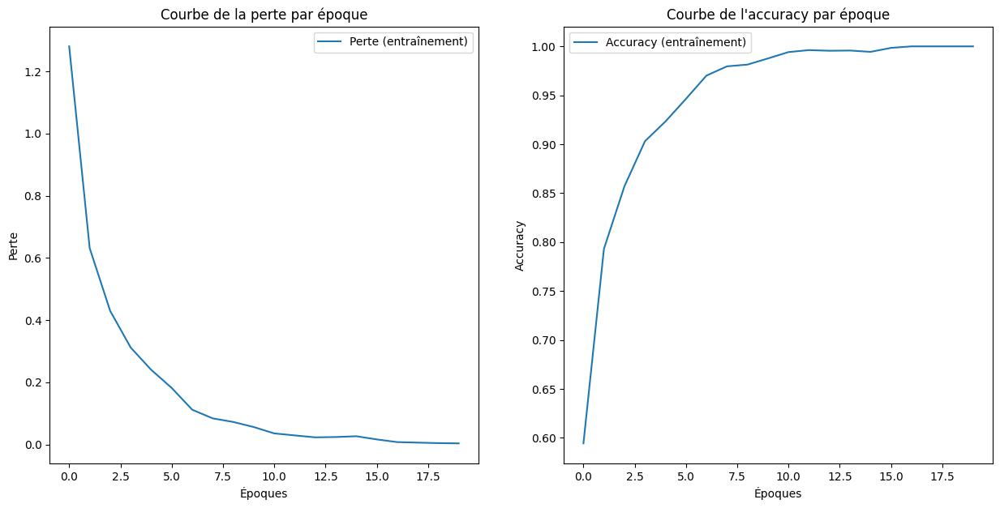

In [21]:
# Affichage de l'historique d'entraînement
import matplotlib.pyplot as plt
plt.figure(figsize=(15,7))

plt.subplot(121)
# Affichage de la perte par époque
plt.plot(history.history['loss'], label='Perte (entraînement)')
plt.title('Courbe de la perte par époque')
plt.xlabel('Époques')
plt.ylabel('Perte')
plt.legend()

plt.subplot(122)
# Affichage de l'accuracy par époque
plt.plot(history.history['accuracy'], label='Accuracy (entraînement)')
plt.title('Courbe de l\'accuracy par époque')
plt.xlabel('Époques')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# 10. Evaluation de la pipeline

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Fonction d'évaluation pipeline de preprocessing + Keras (fittés)     
def evaluate_pipeline(fitted_preproc,fitted_keras,X_test,y_test_enc):
    # Affichage pipeline de preprocessing entraînée
    display(fitted_preproc)
    # Faire passer test dans la pipeline de preprocessing (hors étape finale de resampling)
    X_test_transformed = fitted_preproc[:-1].transform(X_test)
    # Prédiction
    y_pred_proba = fitted_keras.predict(X_test_transformed) # Keras sort une probabilité par classe
    y_pred_enc = np.argmax(y_pred_proba,axis=1) # On récupère la classe la plus probable
    y_true = encoder.inverse_transform(y_test_enc)
    y_pred = encoder.inverse_transform(y_pred_enc)
    # Matrice de confusion
    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_true), yticklabels=np.unique(y_true))
    plt.xlabel("Prédictions")
    plt.ylabel("Vraies classes")
    plt.title("Matrice de confusion")
    plt.show()
    # Rapport de classification
    class_report = classification_report(y_true, y_pred)
    print("Rapport de classification :\n", class_report)

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('hog',
                                                 HOGExtractor(cells_per_block=(3,
                                                                               3),
                                                              pixels_per_cell=(12,
                                                                               12))),
                                                ('glcm', 'drop'),
                                                ('entropie',
                                                 EntropyExtractor()),
                                                ('canny',
                                                 EdgeDensityExtractor(canny_threshold1=70,
                                                                      canny_threshold2=140)),
                                                ('brut',
                                                 PixelsBrutsExtractor())])),
                ('scaler', StandardScaler()), ('reduction', 'passthrough'),
                ('sampler', FunctionSampler())])

35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


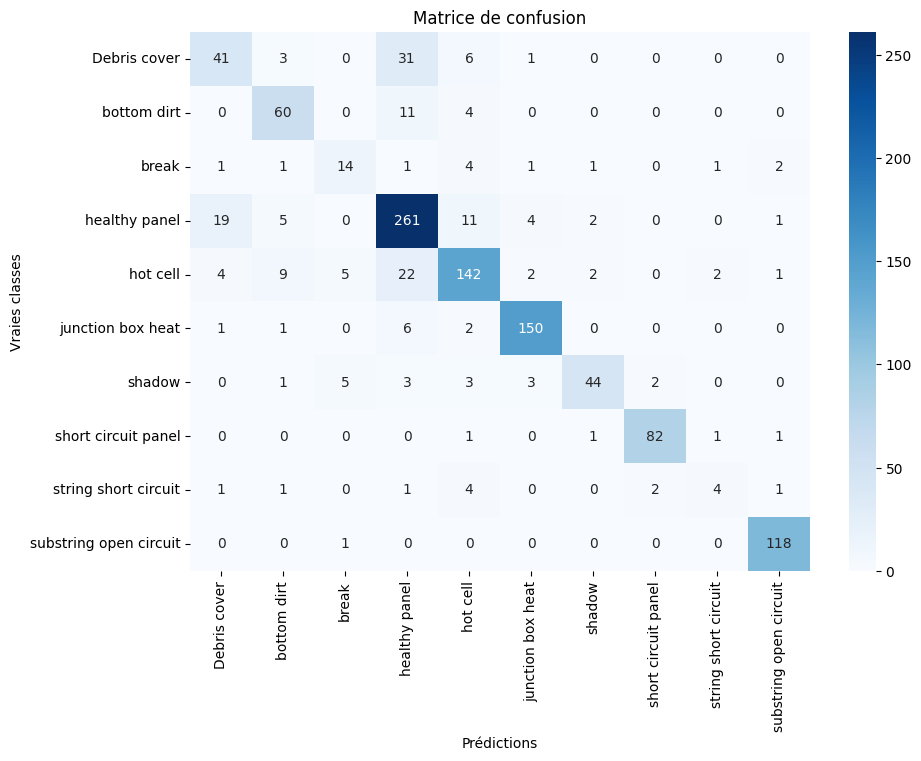

Rapport de classification :
                         precision    recall  f1-score   support

          Debris cover       0.61      0.50      0.55        82
           bottom dirt       0.74      0.80      0.77        75
                 break       0.56      0.54      0.55        26
         healthy panel       0.78      0.86      0.82       303
              hot cell       0.80      0.75      0.78       189
     junction box heat       0.93      0.94      0.93       160
                shadow       0.88      0.72      0.79        61
   short circuit panel       0.95      0.95      0.95        86
  string short circuit       0.50      0.29      0.36        14
substring open circuit       0.95      0.99      0.97       119

              accuracy                           0.82      1115
             macro avg       0.77      0.73      0.75      1115
          weighted avg       0.82      0.82      0.82      1115



In [23]:
# Evaluation
evaluate_pipeline(fitted_preproc,fitted_keras,X_test,y_test_enc)

On a une **généralisation correcte : 82% d'accuracy et 75% de f1-score**. Un peu plus de difficulté dans la détection des défauts de type  : 
- "Debris cover" => souvent confondus avec "Healthy Panel"
- "String short circuit" et "Break" (classes peu représentées dans le dataset) => mauvaise précision et mauvais rappel

### Avec retrait des images carrées mises en doute...

Epoch 1/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4975 - loss: 1.6602
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7794 - loss: 0.6840
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8755 - loss: 0.3748
Epoch 4/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9037 - loss: 0.2841
Epoch 5/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9309 - loss: 0.2197
Epoch 6/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9596 - loss: 0.1432
Epoch 7/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9489 - loss: 0.1571
Epoch 8/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9772 - loss: 0.0843
Epoch 9/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9896 - loss: 0.0558
Epoch 10/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9923 - loss: 0.0453
Epoch 11/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9895 - loss: 0.0379
Epoch 12/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9876 - lo

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('hog',
                                                 HOGExtractor(cells_per_block=(3,
                                                                               3),
                                                              pixels_per_cell=(12,
                                                                               12))),
                                                ('glcm', 'drop'),
                                                ('entropie',
                                                 EntropyExtractor()),
                                                ('canny',
                                                 EdgeDensityExtractor(canny_threshold1=70,
                                                                      canny_threshold2=140)),
                                                ('brut',
                                                 PixelsBrutsExtractor())])),
                ('scaler', StandardScaler()), ('reduction', 'passthrough'),
                ('sampler', FunctionSampler())])

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


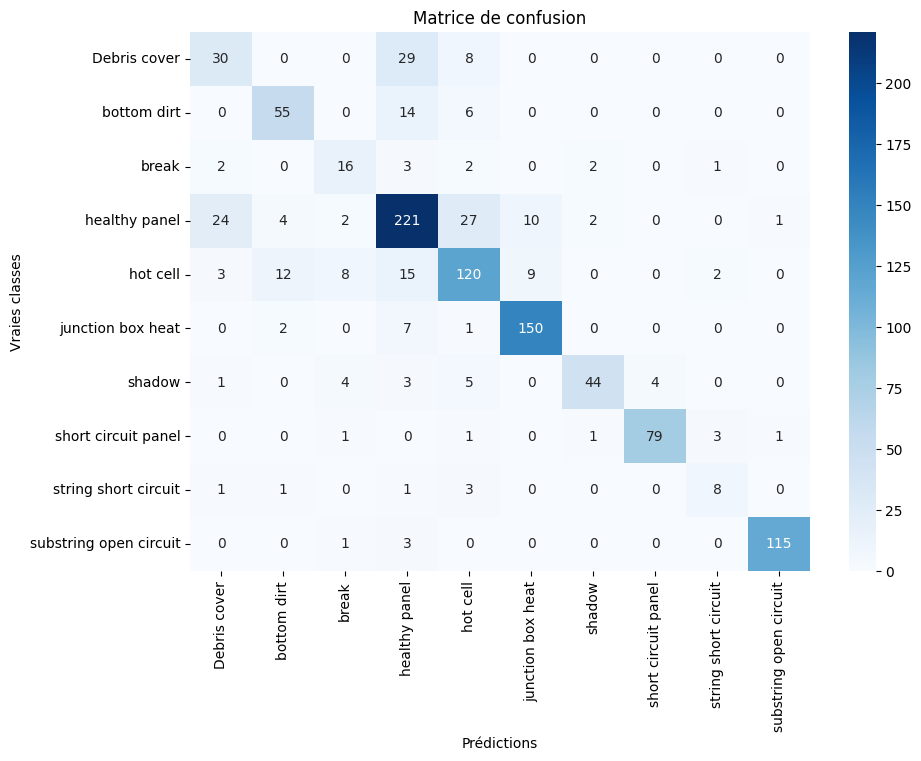

Rapport de classification :
                         precision    recall  f1-score   support

          Debris cover       0.49      0.45      0.47        67
           bottom dirt       0.74      0.73      0.74        75
                 break       0.50      0.62      0.55        26
         healthy panel       0.75      0.76      0.75       291
              hot cell       0.69      0.71      0.70       169
     junction box heat       0.89      0.94      0.91       160
                shadow       0.90      0.72      0.80        61
   short circuit panel       0.95      0.92      0.93        86
  string short circuit       0.57      0.57      0.57        14
substring open circuit       0.98      0.97      0.97       119

              accuracy                           0.78      1068
             macro avg       0.75      0.74      0.74      1068
          weighted avg       0.79      0.78      0.78      1068



In [24]:
# Découpage train/test avec retrait des images carrées
X_train,X_test,y_train,y_test = load_df_from_dataset(csv_pvf10,format="110x60",removeCarre=True)

# Encodage des labels
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train)
y_test_enc = encoder.transform(y_test)

# Entraînement sur train et évaluation sur test
fitted_preproc,fitted_keras,history = train_pipeline(my_preproc,X_train,y_train_enc)
evaluate_pipeline(fitted_preproc,fitted_keras,X_test,y_test_enc)

Suite au retrait des images carrées, les f1-score peuvent varier légèrement sur les différentes classes mais la performance sur le f1-score reste similaire au global.

### Avec le découpage proposé par les constructeurs du dataset...

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5013 - loss: 1.5073
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7866 - loss: 0.6254
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8414 - loss: 0.4598
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8908 - loss: 0.3339
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9294 - loss: 0.2312
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9415 - loss: 0.1877
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9608 - loss: 0.1316
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9748 - loss: 0.0948
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9795 - loss: 0.0808
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9823 - loss: 0.0698
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9739 - loss: 0.0914
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9688 - lo

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('hog',
                                                 HOGExtractor(cells_per_block=(3,
                                                                               3),
                                                              pixels_per_cell=(12,
                                                                               12))),
                                                ('glcm', 'drop'),
                                                ('entropie',
                                                 EntropyExtractor()),
                                                ('canny',
                                                 EdgeDensityExtractor(canny_threshold1=70,
                                                                      canny_threshold2=140)),
                                                ('brut',
                                                 PixelsBrutsExtractor())])),
                ('scaler', StandardScaler()), ('reduction', 'passthrough'),
                ('sampler', FunctionSampler())])

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


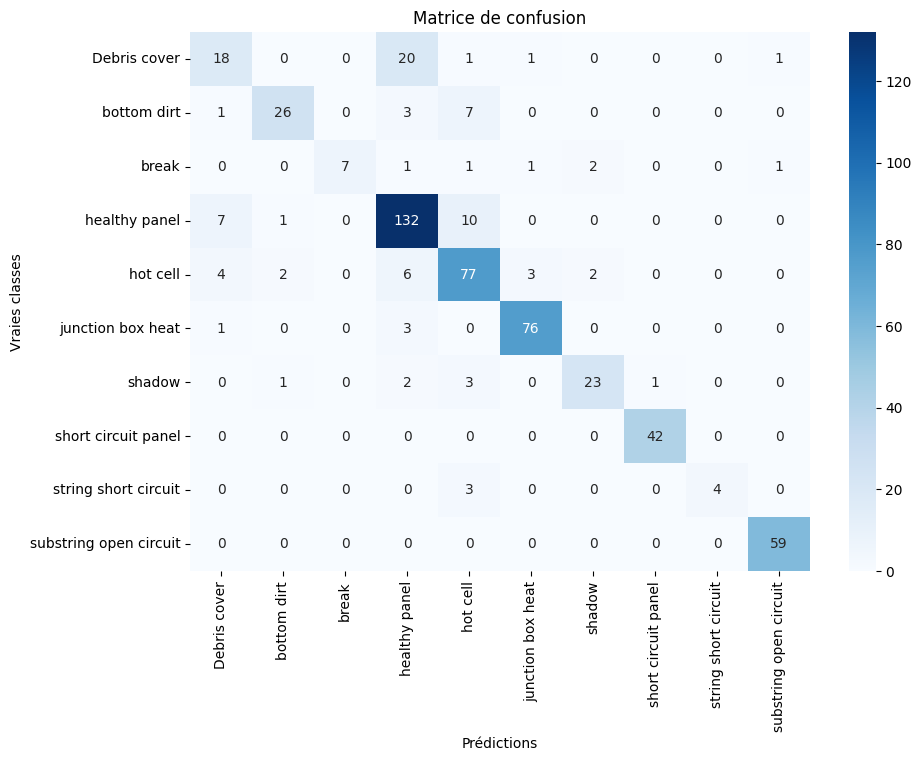

Rapport de classification :
                         precision    recall  f1-score   support

          Debris cover       0.58      0.44      0.50        41
           bottom dirt       0.87      0.70      0.78        37
                 break       1.00      0.54      0.70        13
         healthy panel       0.79      0.88      0.83       150
              hot cell       0.75      0.82      0.79        94
     junction box heat       0.94      0.95      0.94        80
                shadow       0.85      0.77      0.81        30
   short circuit panel       0.98      1.00      0.99        42
  string short circuit       1.00      0.57      0.73         7
substring open circuit       0.97      1.00      0.98        59

              accuracy                           0.84       553
             macro avg       0.87      0.77      0.80       553
          weighted avg       0.84      0.84      0.83       553



In [25]:
# Découpage train / test proposé par les constructeurs du dataset
X_train,X_test,y_train,y_test = load_df_from_dataset(csv_pvf10,format="110x60",originalTrainTest=True)

# Encodage des labels
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train)
y_test_enc = encoder.transform(y_test)

# Entraînement sur train et évaluation sur test
fitted_preproc,fitted_keras,history = train_pipeline(my_preproc,X_train,y_train_enc)
evaluate_pipeline(fitted_preproc,fitted_keras,X_test,y_test_enc)

Avec le découpage proposé par les constructeurs du dataset (90% / 10%), on améliore légèrement les résultats : **84% d'accuracy et 80% de f1-score**. Pour rappel dans leur article de recherche, le meilleur score atteint avec des modèles de Deep Learning pour les images 110x60 était de 92% d'accuracy et 91% de f1-score.

### Avec le format d'images original (avant recadrage / découpage en 110x60)...

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5080 - loss: 1.5184
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7599 - loss: 0.7512
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8235 - loss: 0.5070
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8487 - loss: 0.4279
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8770 - loss: 0.3465
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8821 - loss: 0.3311
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9204 - loss: 0.2479
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9126 - loss: 0.2429
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9311 - loss: 0.2035
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9389 - loss: 0.1859
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9593 - loss: 0.1275
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9728 - lo

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('hog',
                                                 HOGExtractor(cells_per_block=(3,
                                                                               3),
                                                              pixels_per_cell=(12,
                                                                               12))),
                                                ('glcm', 'drop'),
                                                ('entropie',
                                                 EntropyExtractor()),
                                                ('canny',
                                                 EdgeDensityExtractor(canny_threshold1=70,
                                                                      canny_threshold2=140)),
                                                ('brut',
                                                 PixelsBrutsExtractor())])),
                ('scaler', StandardScaler()), ('reduction', 'passthrough'),
                ('sampler', FunctionSampler())])

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


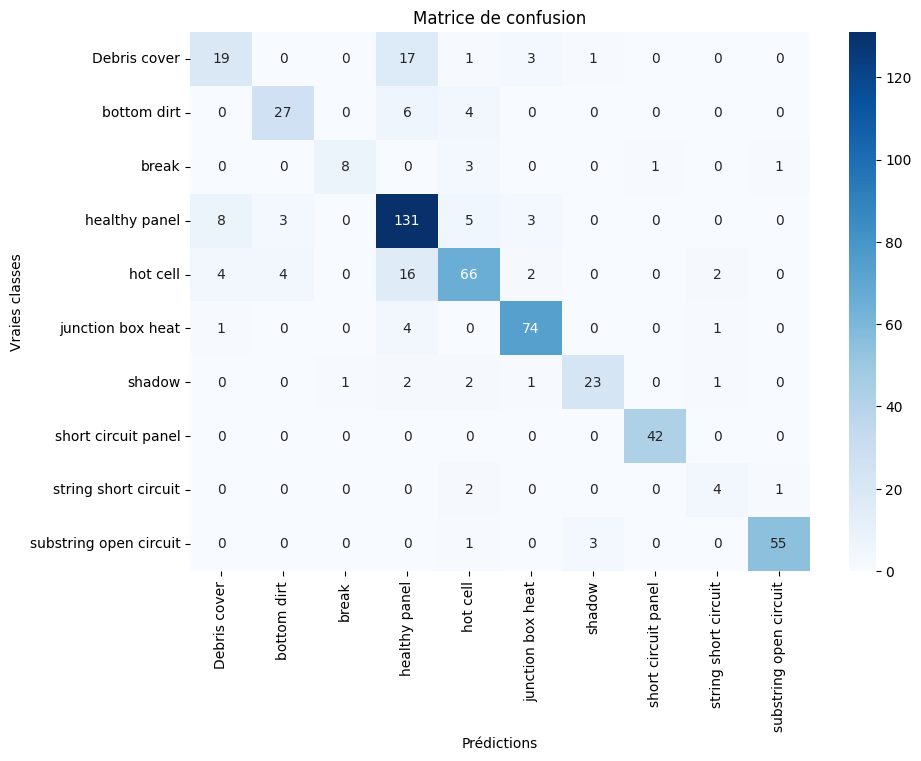

Rapport de classification :
                         precision    recall  f1-score   support

          Debris cover       0.59      0.46      0.52        41
           bottom dirt       0.79      0.73      0.76        37
                 break       0.89      0.62      0.73        13
         healthy panel       0.74      0.87      0.80       150
              hot cell       0.79      0.70      0.74        94
     junction box heat       0.89      0.93      0.91        80
                shadow       0.85      0.77      0.81        30
   short circuit panel       0.98      1.00      0.99        42
  string short circuit       0.50      0.57      0.53         7
substring open circuit       0.96      0.93      0.95        59

              accuracy                           0.81       553
             macro avg       0.80      0.76      0.77       553
          weighted avg       0.81      0.81      0.81       553



In [26]:
# Découpage train / test proposé par les constructeurs du dataset sur les images originales
X_train,X_test,y_train,y_test = load_df_from_dataset(csv_pvf10,format="Ori",originalTrainTest=True)

# Encodage des labels
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train)
y_test_enc = encoder.transform(y_test)

# Entraînement sur train et évaluation sur test
fitted_preproc,fitted_keras,history = train_pipeline(my_preproc,X_train,y_train_enc)
evaluate_pipeline(fitted_preproc,fitted_keras,X_test,y_test_enc)

Comme prévu, les résultats sont légèrement inférieurs au format 110x60 mais restent tout-à-fait corrects : 81% d'accuracy et 77% de f1-score.

# 11. Interprétabilité

Le réseau de neurones ne permet pas une interprétabilité spécifique. Nous devons faire appel à une interprétabilité agnostique.

On récupère les données d'entrée extraites et mises à l'échelle.

Nous allons étudier l'interprétabilité de ces données par notre réseau de neurones.

In [33]:
# On reprend notre pipeline avec les paramètres optimisés
interp_preproc = ImbPipeline([
    ('features', FeatureUnion([
        ('hog', HOGExtractor(image_size=(60,110),pixels_per_cell=(12,12),cells_per_block=(3,3))),
        ('entropie',EntropyExtractor(image_size=(60,110),radius=4, bins=10, include_histogram=True)),
        ('canny',EdgeDensityExtractor(image_size=(60,110),canny_threshold1=70,canny_threshold2=140)),
        ('brut',PixelsBrutsExtractor(image_size=(30,55)))
    ])),
    ('scaler', StandardScaler()),
    ('reduction', "passthrough"),
    ('sampler', FunctionSampler(func=None))
])

# Découpage train / test par défaut
X_train,X_test,y_train,y_test = load_df_from_dataset(csv_pvf10,format="110x60")

# Encodage des labels
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train)
y_test_enc = encoder.transform(y_test)

# Entraînement pipeline de preprocessing et Keras
fitted_preproc,fitted_keras,history = train_pipeline(interp_preproc,X_train,y_train_enc)

# On récupère l'ensemble train extrait et mis à l'échelle
X_train_transformed = fitted_preproc[:-1].transform(X_train)
X_train_transformed = pd.DataFrame(X_train_transformed,index = X_train.index,columns=fitted_preproc.get_feature_names_out())
display (X_train_transformed)

# On récupère l'ensemble test extrait et mis à l'échelle
X_test_transformed = fitted_preproc[:-1].transform(X_test)
X_test_transformed = pd.DataFrame(X_test_transformed,index = X_test.index,columns=fitted_preproc.get_feature_names_out())
display (X_test_transformed)

# On récupère la prédiction du réseau de neurones sur l'ensemble test
y_pred_proba = fitted_keras.predict(X_test_transformed) # Keras sort une probabilité par classe
y_pred_enc = np.argmax(y_pred_proba,axis=1) # Classe prédite
y_pred = encoder.inverse_transform(y_pred_enc) # Classe prédite avec le label d'origine


Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4549 - loss: 1.6744 - val_accuracy: 0.6962 - val_loss: 0.9408
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7795 - loss: 0.6693 - val_accuracy: 0.7466 - val_loss: 0.7541
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8615 - loss: 0.4267 - val_accuracy: 0.7713 - val_loss: 0.7345
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9084 - loss: 0.3014 - val_accuracy: 0.7780 - val_loss: 0.7009
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9310 - loss: 0.2238 - val_accuracy: 0.7758 - val_loss: 0.6870
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9662 - loss: 0.1386 - val_accuracy: 0.7724 - val_loss: 0.7665
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9719 - loss: 0.1139 - val_accuracy: 0.7971 - val_loss: 0.7352
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9860 - loss: 0.0738 - val_accuracy: 0.7937 - val_los

hog__HOG_1  hog__HOG_2  hog__HOG_3  hog__HOG_4  hog__HOG_5  hog__HOG_6  \
5277    0.285929    3.005396    1.866659    0.984336    0.243158   -1.218882   
3825    0.523577    1.253284    0.597117   -0.406204   -2.261185   -0.777366   
3171   -1.641082   -1.034299   -0.603236   -1.254063   -1.795209   -0.778230   
2697    0.313384    1.172335   -0.179234    1.019154    0.271562    2.711611   
1610   -0.003432    1.736215    0.739756   -0.627785   -0.445491   -1.065866   
...          ...         ...         ...         ...         ...         ...   
2136    0.343049    1.174474   -0.486420   -1.138922    0.017599    0.544242   
5554   -0.228747   -1.212115   -0.765897   -0.056985   -1.213430   -0.260938   
709    -2.032742   -1.264846   -0.924885    2.889921    2.874213    0.310890   
4055   -1.931050   -0.293635   -0.015003    0.041994   -1.692765   -0.235253   
4511    0.432627   -0.109909   -0.221256   -0.649841    0.146668   -0.913774   

      hog__HOG_7  hog__HOG_8  hog__HOG_9  hog__HOG_10  hog__HOG_11  \
5277   -0.864612   -0.799954    1.023613     0.371361     0.311139   
3825   -0.891190   -0.558625   -0.812702    -0.351138     0.054274   
3171    0.714468   -0.582401   -1.044622    -0.508955    -0.304163   
2697   -0.430155    1.095827   -0.050524     1.390688    -0.585522   
1610   -0.765248   -0.369633   -0.628706     0.010830     0.491513   
...          ...         ...         ...          ...          ...   
2136   -0.167017    2.233233    1.458840    -0.411786    -0.682253   
5554    0.163370   -0.874764   -1.144785    -0.377785    -0.615720   
709    -0.815186   -0.365437   -1.179833    -0.527800    -0.975654   
4055   -0.504216   -0.197085   -1.088219    -0.997296    -0.841103   
4511   -0.668697   -0.603799    1.532113    -0.055174    -0.231401   

      hog__HOG_12  hog__HOG_13  hog__HOG_14  hog__HOG_15  hog__HOG_16  \
5277     0.235101    -0.957905    -1.681253    -0.779894     0.151084   
3825     1.192743     0.411925    -2.029801    -1.183299     0.254073   
3171    -0.365176    -0.495884    -1.164861    -0.366869    -0.216224   
2697     2.043361    -0.742762     0.417775     2.369411     0.532591   
1610     0.154807    -0.431879    -0.687988    -0.868862    -0.444913   
...           ...          ...          ...          ...          ...   
2136    -0.954817    -0.773133    -0.317166     0.222612     0.058691   
5554    -0.387263    -0.453913     1.948453    -0.429992    -0.494700   
709     -1.357305     0.339769     2.541043     2.108836    -0.208438   
4055    -0.331510    -0.036212     0.690730     0.978119    -0.883088   
4511    -0.451657    -0.679023    -0.659377    -0.741052     1.066768   

      hog__HOG_17  hog__HOG_18  hog__HOG_19  hog__HOG_20  hog__HOG_21  \
5277    -0.340983    -0.541862     0.181058    -0.470184    -0.418590   
3825     3.848061     2.263166    -0.740801     0.004677    -0.324683   
3171    -0.010532    -0.298151    -0.219768    -0.289907    -0.206225   
2697    -0.073375    -0.541862     0.456503     0.129902     0.261372   
1610    -0.167323    -0.166804     1.139987     2.384728     3.316351   
...           ...          ...          ...          ...          ...   
2136    -0.489949    -0.175969     0.262179     0.160252    -0.298133   
5554    -0.738350    -0.541862    -0.896671    -0.810812    -0.430705   
709     -0.737666    -0.541862    -0.493547    -0.715770    -1.098673   
4055    -0.789828    -0.541862    -1.051944    -0.854940    -0.549838   
4511    -0.367401    -0.186869     0.772616     0.569222     0.163618   

      hog__HOG_22  hog__HOG_23  hog__HOG_24  hog__HOG_25  hog__HOG_26  \
5277    -1.326548    -1.562716    -1.306745     0.007543    -0.024928   
3825    -0.465365    -1.511944     0.455467     0.820993     0.453690   
3171    -1.155743    -1.342478    -0.469449    -0.517066    -0.533967   
2697    -0.650667    -0.797373    -0.391423     0.277086     0.154065   
1610     1.213696    -1.558626     1.386297     3.316972     3.302903   
...         

hog__HOG_1  hog__HOG_2  hog__HOG_3  hog__HOG_4  hog__HOG_5  hog__HOG_6  \
4376    0.993776    1.636437   -0.119584   -0.388287    0.975446   -0.498835   
2109   -0.752178   -0.835298    2.875903    1.406380    0.013824    0.893169   
4508    0.778116   -0.351488   -0.972934    1.437455    0.752340    0.786537   
3203   -0.843304   -0.143478   -0.521379   -1.189199    0.303887   -0.504861   
1246    0.526760    0.299814   -0.104075   -0.425910    0.492305    0.047335   
...          ...         ...         ...         ...         ...         ...   
1382    0.646056    0.070854   -0.822696   -0.667342   -0.016872   -0.885998   
3699    0.394723    0.804006    0.246880   -0.346485   -0.335913   -1.016378   
2222    0.305468    1.536602   -0.529067   -0.062624    0.263372    0.218347   
4119    0.156824    0.344740   -0.581832    0.701649    0.109596   -0.830850   
1401    0.636112   -0.586177   -0.352083   -0.865569    0.605433   -0.326193   

      hog__HOG_7  hog__HOG_8  hog__HOG_9  hog__HOG_10  hog__HOG_11  \
4376   -0.479569   -0.917794    1.190598    -0.373179    -0.856936   
2109    1.255712    0.211335   -0.677942    -0.794823    -0.420298   
4508   -0.593321   -0.391494    0.868450     1.146599    -0.975654   
3203    0.026475   -0.502208   -0.896530    -0.152511     0.309802   
1246    0.548762    0.503402   -1.063182     0.343634    -0.263175   
...          ...         ...         ...          ...          ...   
1382   -0.471049   -0.681349    1.706695     0.770595    -0.300964   
3699   -1.040324   -0.700460   -0.612783     0.655465    -0.775380   
2222   -0.703416    0.515009    0.304694    -0.526105    -0.485955   
4119   -1.082937   -0.986624   -0.972968    -1.468156    -0.883253   
1401   -0.332846   -0.090667    1.698561    -0.467524     1.482906   

      hog__HOG_12  hog__HOG_13  hog__HOG_14  hog__HOG_15  hog__HOG_16  \
4376    -1.131808    -0.621201     0.992011    -0.174486    -0.490463   
2109    -1.039820    -1.125075     0.335558     2.252334     1.742602   
4508    -1.047825     0.728728     0.809998     0.291461    -1.166441   
3203     0.543078    -1.400202    -1.352356    -0.297309    -0.292074   
1246     0.102709     1.115451     0.597860     0.372076     0.125018   
...           ...          ...          ...          ...          ...   
1382    -0.013069    -0.398649    -1.261201    -0.824549    -0.123248   
3699    -0.721584    -0.903442    -0.011993    -0.072715     1.928689   
2222     0.316047    -0.573862     0.166074     0.012128     0.390150   
4119    -0.780361     1.645126     0.285642    -1.291990    -1.189477   
1401     1.275663     0.037318    -1.421640    -1.112268    -0.411406   

      hog__HOG_17  hog__HOG_18  hog__HOG_19  hog__HOG_20  hog__HOG_21  \
4376    -0.611653    -0.395495    -0.598954    -0.763587    -1.211555   
2109     0.099824     0.034234    -0.089128     0.233728     0.290973   
4508    -0.647225    -0.408182     0.919266     0.087644    -0.446319   
3203     0.117088    -0.193385    -0.643677     0.024998     0.264570   
1246    -0.157056    -0.014092    -0.057048     0.313583    -0.668434   
...           ...          ...          ...          ...          ...   
1382    -0.121289    -0.371473     1.109550     0.161523     0.939528   
3699     2.387628     4.357188    -0.518842    -0.642911    -1.108681   
2222    -0.271910    -0.475755     0.032697     0.373337    -0.398947   
4119    -0.789828    -0.541862    -1.352579    -0.854940     0.269765   
1401    -0.495399    -0.027110    -0.380368    -0.167916    -0.443604   

      hog__HOG_22  hog__HOG_23  hog__HOG_24  hog__HOG_25  hog__HOG_26  \
4376    -1.211457     0.971057    -0.862301    -0.991491    -0.727138   
2109     1.343738     0.261620     1.710744     1.944835     0.239867   
4508    -0.138194     0.774354     0.240715    -0.655421    -0.514707   
3203    -0.809075    -1.342134    -0.473420    -0.397307    -0.171045   
1246    -0.925970     0.388990     0.448973     0.250138    -0.160727   
...         

35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


### Interprétabilité SHAP

Nous allons utiliser le modèle d'interprétabilité **SHAP Deep Explainer** qui est bien adapté aux réseaux de neurones. On commence par l'interprétabilité globale sur l'ensemble des classes.

In [76]:
# Interprétabilité GLOBALE avec SHAP DeepExplainer
import shap

# On utilise 10% du jeu d'entraînement comme background pour SHAP
_, background, _, _ = train_test_split(X_train_transformed, y_train_enc, test_size=0.1, random_state=42, stratify=y_train_enc)

# Initialiser le DeepExplainer pour notre réseau de neurones
explainer = shap.DeepExplainer(fitted_keras, background)

# Calculer les shap-values pour le jeu de test
shap_values = explainer.shap_values(X_test_transformed.values)

d:\Sources\DS-projet\SEP24-CDS-PHOTOVOLTAIQUE\env\Lib\site-packages\shap\explainers\_deep\deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
d:\Sources\DS-projet\SEP24-CDS-PHOTOVOLTAIQUE\env\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_98
Received: inputs=['Tensor(shape=(446, 3369))']
  warnings.warn(msg)
d:\Sources\DS-projet\SEP24-CDS-PHOTOVOLTAIQUE\env\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_98
Received: inputs=['Tensor(shape=(892, 3369))']
  warnings.warn(msg)
d:\Sources\DS-projet\SEP24-CDS-PHOTOVOLTAIQUE\env\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` do

C:\Users\maxbe\AppData\Local\Temp\ipykernel_29624\573635178.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values,X_test_transformed,plot_type='bar',class_names=encoder.classes_)


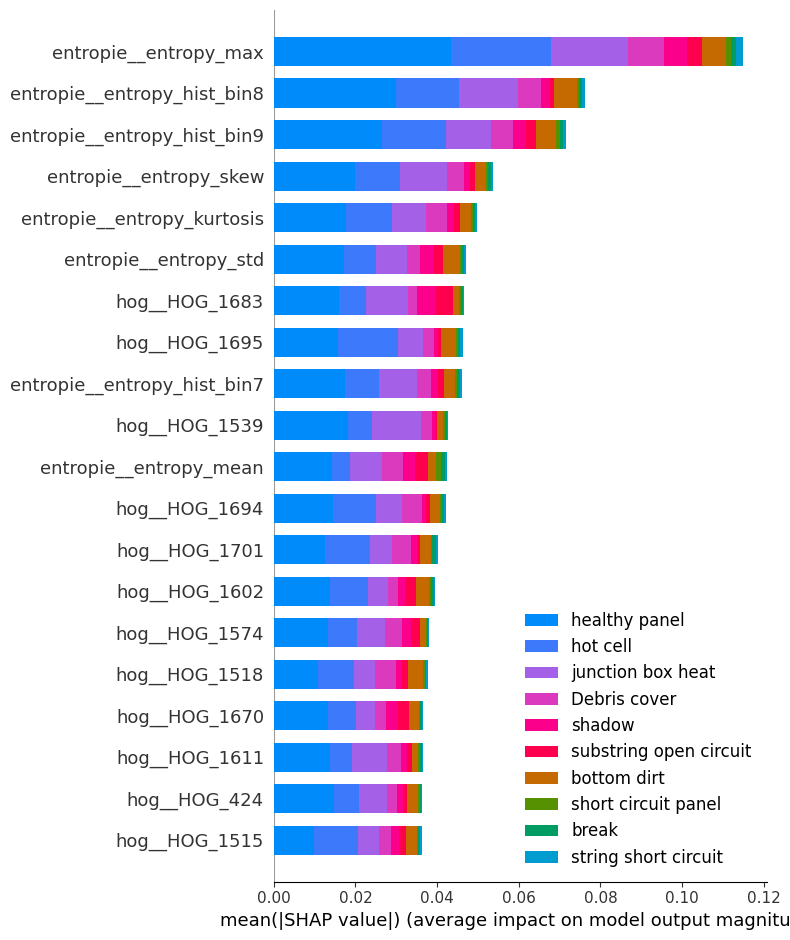

In [79]:
# Afficher l'interprétation globale
shap.summary_plot(shap_values,X_test_transformed,plot_type='bar',class_names=encoder.classes_)

On peut déduire de ces Shap values :
- l'**importance de la carte d'entropie** dans la classification : les différentes statistiques utilisées arrivent en tête du classement
- l'**importance des vecteurs HOG**, plus influents que les pixels bruts par exemple

### Zoom sur la classe Healthy panel

C:\Users\maxbe\AppData\Local\Temp\ipykernel_29624\1146219148.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, idx_healthy_panel], X_test_transformed, max_display=10,show=False)


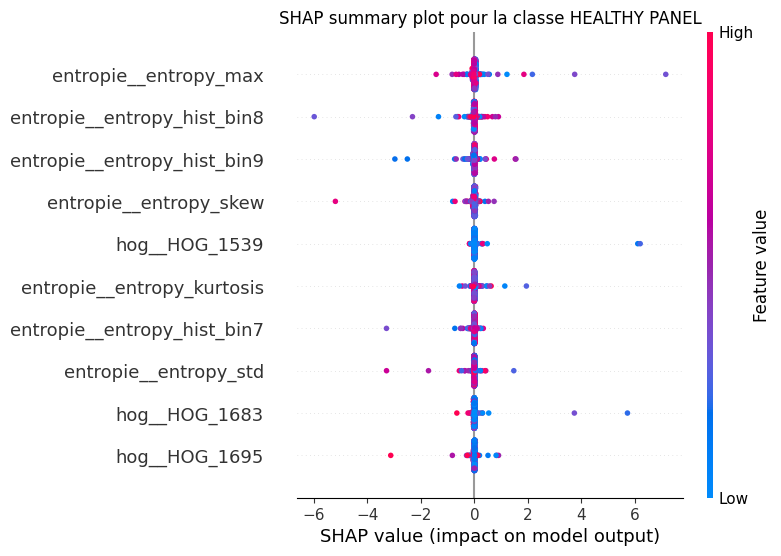

In [122]:
idx_healthy_panel = encoder.classes_.tolist().index("healthy panel")
shap.summary_plot(shap_values[:, :, idx_healthy_panel], X_test_transformed, max_display=10,show=False)
plt.title("SHAP summary plot pour la classe HEALTHY PANEL")
plt.show()


L'entropie max est la feature la plus importante pour la classe Healthy Panel. Voyons précisément comment les valeurs de Shapley évoluent en fonction de cette feature pour cette classe.  

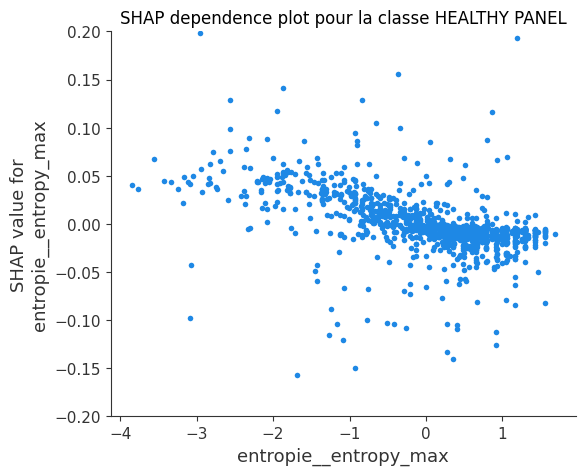

In [112]:
shap.dependence_plot("entropie__entropy_max", shap_values[:, :, idx_healthy_panel], X_test_transformed,
                     interaction_index=None,show=False)
plt.ylim(-0.2, 0.2)
plt.title("SHAP dependence plot pour la classe HEALTHY PANEL")
plt.show()

On visualise une légère tendance à la baisse => **une entropie max élevée est plutôt défavorable à la classe Healthy Panel**. Ce qui est logique, un panneau sain doit présenter une intensité homogène.

### Zoom sur la classe Short Circuit Panel

C:\Users\maxbe\AppData\Local\Temp\ipykernel_29624\3216724462.py:2: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values[:, :, idx_short_circuit], X_test_transformed, max_display=10,show=False)


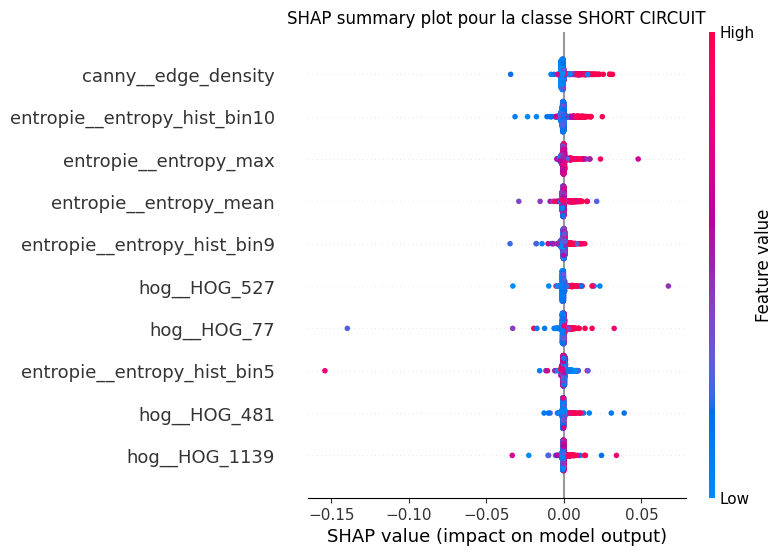

In [120]:
idx_short_circuit = encoder.classes_.tolist().index("short circuit panel")
shap.summary_plot(shap_values[:, :, idx_short_circuit], X_test_transformed, max_display=10,show=False)
plt.title("SHAP summary plot pour la classe SHORT CIRCUIT")
plt.show()

La densité de contours est la feature la plus importante pour la classe Short Circuit Panel. Voyons précisément comment les valeurs de Shapley évoluent en fonction de cette feature pour cette classe.  

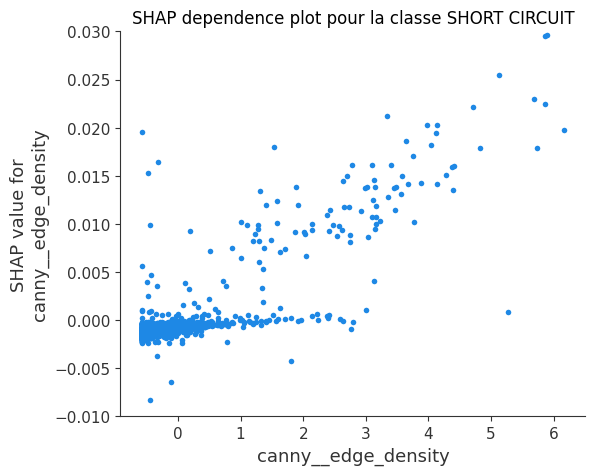

In [117]:
shap.dependence_plot("canny__edge_density", shap_values[:, :, idx_short_circuit], X_test_transformed,
                     interaction_index=None,show=False)
plt.ylim(-0.01, 0.03)
plt.title("SHAP dependence plot pour la classe SHORT CIRCUIT")
plt.show()

On visualise une tendance à la hausse => **une densité de contours élevée est favorable à la classe Short circuit**. Ce qui est logique, un court-circuit entraîne de fortes variations de température dans le panneau.

### Zoom sur une image

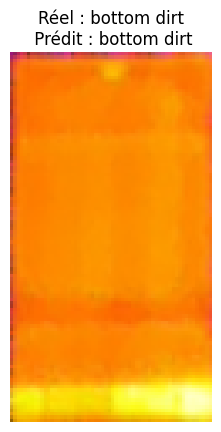

In [144]:
# On choisit une instance de test à expliquer
instance_idx = 100
img = cv2.imread(X_test.iloc[instance_idx]["Chemin"])
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Réel : {y_test.iloc[instance_idx]}\n Prédit : {y_pred[instance_idx]}")
plt.show()

In [145]:
predicted_class_idx = encoder.classes_.tolist().index("bottom dirt")
print (f"Probabilité prédiction classe bottom dirt : {y_pred_proba[instance_idx][predicted_class_idx]}")

Probabilité prédiction classe bottom dirt : 0.9999446868896484


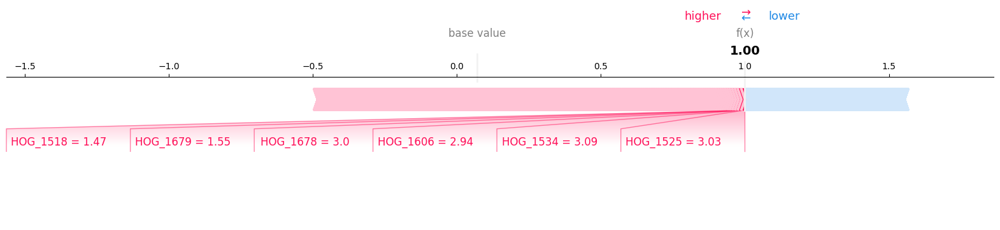

In [149]:
import re

# Force-plot SHAP sur la classe prédite
shap.force_plot(
    float(explainer.expected_value[predicted_class_idx]), 
    shap_values[instance_idx,:,predicted_class_idx], 
    np.round(X_test_transformed.iloc[instance_idx].values,2), # On arrondit les valeurs pour la présentation du graphique
    feature_names = [re.sub(r'^.*?__', '', col) for col in X_test_transformed.columns], # On coupe le début du nom de feature pour la présentation du graphique
    contribution_threshold = 0.004, # On n'affiche que les features les + importantes
    matplotlib=True,
)

In [155]:
print("Moyenne des features HOG sur le jeu de test, pour comparaison : ")
display(X_test_transformed[['hog__HOG_1518','hog__HOG_1679','hog__HOG_1678','hog__HOG_1606','hog__HOG_1534','hog__HOG_1525']].mean())

Moyenne des features HOG sur le jeu de test, pour comparaison : 


hog__HOG_1518   -0.013325
hog__HOG_1679   -0.029302
hog__HOG_1678   -0.007571
hog__HOG_1606   -0.010205
hog__HOG_1534   -0.009240
hog__HOG_1525   -0.027021
dtype: float64

Ce sont donc des valeurs élevées de gradient qui ont contribué en premier lieu à la classe Bottom Dirt pour cette image. Visualisons les cellules HOG correspondantes.

In [154]:
# Fonction de décodage des infos HOG correspondant à une feature HOG:
# - localisation du bloc de normalisation
# - localisation de la cellule HOG (dans le bloc et en absolu)
# - orientation du gradient
def decode_hog_index(index, 
                     image_shape=(110, 60), 
                     pixels_per_cell=(12, 12), 
                     cells_per_block=(3, 3), 
                     orientations=9):

    n_cells_y = image_shape[0] // pixels_per_cell[0]  # vertical
    n_cells_x = image_shape[1] // pixels_per_cell[1]  # horizontal

    n_blocks_y = n_cells_y - cells_per_block[0] + 1
    n_blocks_x = n_cells_x - cells_per_block[1] + 1

    values_per_block = orientations * cells_per_block[0] * cells_per_block[1]

    # Étape 1 : bloc et position locale
    block_idx = index // values_per_block
    index_in_block = index % values_per_block

    cell_in_block_idx = index_in_block // orientations
    orientation_idx = index_in_block % orientations

    row_in_block = cell_in_block_idx // cells_per_block[1]
    col_in_block = cell_in_block_idx % cells_per_block[1]

    # Étape 2 : position du bloc dans l’image
    block_row = block_idx // n_blocks_x
    block_col = block_idx % n_blocks_x

    # Étape 3 : position absolue de la cellule dans l’image (en indices de cellule)
    cell_row_abs = block_row + row_in_block
    cell_col_abs = block_col + col_in_block

    # Étape 4 : position en pixels de la cellule
    pixel_top = cell_row_abs * pixels_per_cell[0]
    pixel_bottom = (cell_row_abs + 1) * pixels_per_cell[0] - 1

    pixel_left = cell_col_abs * pixels_per_cell[1]
    pixel_right = (cell_col_abs + 1) * pixels_per_cell[1] - 1

    return {
        "block_index": block_idx,
        "block_position": (block_row, block_col),
        "cell_in_block": (row_in_block, col_in_block),
        "cell_absolute": (cell_row_abs, cell_col_abs),
        "orientation": orientation_idx,
        "cell_pixel_range": {
            "rows": (pixel_top, pixel_bottom),
            "cols": (pixel_left, pixel_right)
        }
    }

In [156]:
from skimage.feature import hog

# Fonction d'affichage des cellules HOG :
# En vert : affichage des features HOG favorables à une classe
# En rouge : affichage des features HOG défavorables à une classe
def show_hog_cell(image, hog_favorable_index_list=[],favorable_class_name="",
                  hog_defavorable_index_list=[],defavorable_class_name="",
                  image_shape=(110, 60), 
                  pixels_per_cell=(12, 12),
                  cells_per_block=(3, 3), 
                  orientations=9):
    
    # Récupérer vecteur et image HOG
    hog_features, hog_image = hog(
        cv2.cvtColor(image, cv2.COLOR_BGR2GRAY),
        pixels_per_cell=pixels_per_cell,
        cells_per_block=cells_per_block,
        orientations=orientations,
        visualize=True,
        feature_vector=True
        )
    
    # Affichage de l'image HOG
    fig, ax = plt.subplots()
    ax.imshow(hog_image, cmap='gray')

    # Pour chaque feature HOG favorable à afficher
    for hog_index in hog_favorable_index_list :
        # Récupérer les infos sur la feature HOG
        info = decode_hog_index(hog_index, image_shape, pixels_per_cell, cells_per_block, orientations)
        rows = info['cell_pixel_range']['rows']
        cols = info['cell_pixel_range']['cols']

        # Tracer le rectangle de la cellule HOG correspondante en vert
        rect = plt.Rectangle(
            (cols[0], rows[0]),  # x, y (colonne = x ; ligne = y)
            cols[1] - cols[0] + 1,
            rows[1] - rows[0] + 1,
            linewidth=2,
            edgecolor='green',
            facecolor='none'
        )
        ax.add_patch(rect)
    
    # Pour chaque feature HOG défavorable à afficher
    for hog_index in hog_defavorable_index_list :
        # Récupérer les infos sur la feature HOG
        info = decode_hog_index(hog_index, image_shape, pixels_per_cell, cells_per_block, orientations)
        rows = info['cell_pixel_range']['rows']
        cols = info['cell_pixel_range']['cols']

        # Tracer le rectangle de la cellule HOG correspondante en rouge
        rect = plt.Rectangle(
            (cols[0], rows[0]),  # x, y (colonne = x ; ligne = y)
            cols[1] - cols[0] + 1,
            rows[1] - rows[0] + 1,
            linewidth=2,
            linestyle='--',
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)

    # Adapter le titre suivant le nom des classes favorables / défavorables
    title = "Cellules HOG importantes pour la prédiction de l'image"
    if favorable_class_name:
        title += f"\nEn vert : favorable {favorable_class_name}"
    if defavorable_class_name:
        title += f"\nEn rouge : défavorable {defavorable_class_name}"
    plt.title(title)
    plt.show()

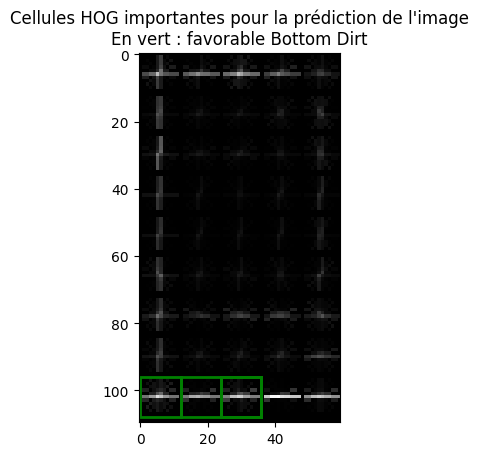

In [ ]:
# Affichage des 6 features HOG favorables à la classe Bottom dirt
show_hog_cell(img,[1517,1678,1677,1605,1533,1524],"Bottom Dirt")# pour les index : faire -1 par rapport au nom des features)

On remarque que les gradients à valeur élevée en bas de l'image ont particulièrement contribué à la prédiction de la classe Bottom dirt : c'est effectivement dans cette zone que se trouve la bande de salissure qui a engendré une variation de température.

**Grâce à SHAP Deep Explainer, nous arrivons à donner des interprétations métier aux classifications de notre réseau de neurones, à la fois au niveau global et local.**

# 12. Généralisation hors dataset

Voyons sur quelques images de panneaux trouvées **hors dataset** si notre modèle arrive à détecter des défauts

Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4586 - loss: 1.7470 - val_accuracy: 0.7186 - val_loss: 0.8655
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7821 - loss: 0.6602 - val_accuracy: 0.7489 - val_loss: 0.7639
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8691 - loss: 0.4151 - val_accuracy: 0.7713 - val_loss: 0.7196
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9027 - loss: 0.3041 - val_accuracy: 0.7657 - val_loss: 0.7147
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9394 - loss: 0.2062 - val_accuracy: 0.7791 - val_loss: 0.7045
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9621 - loss: 0.1452 - val_accuracy: 0.7848 - val_loss: 0.7033
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9797 - loss: 0.1009 - val_accuracy: 0.7825 - val_loss: 0.7613
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9708 - loss: 0.1155 - val_accuracy: 0.7859 - val_loss

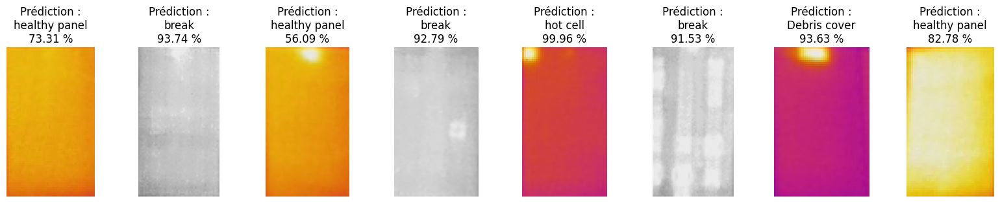

In [23]:
# On revient sur le découpage train / test de départ
X_train,X_test,y_train,y_test = load_df_from_dataset(csv_pvf10,format="110x60")

# Encodage des labels
encoder = LabelEncoder()
y_train_enc = encoder.fit_transform(y_train)
y_test_enc = encoder.transform(y_test)

# Entraînement sur train et évaluation sur test
fitted_preproc,fitted_keras,history = train_pipeline(my_preproc,X_train,y_train_enc)

# Quelques images de test hors dataset pour la prédiction
plt.figure(figsize=(20, 3))
for i,unit_test_path in enumerate(["UT_images_ext/UT_healthy.png",
                                   "UT_images_ext/UT_junction_box.png",
                                   "UT_images_ext/UT_junction_box_2.png",
                                   "UT_images_ext/UT_one_cell.png",
                                   "UT_images_ext/UT_one_cell_2.png",
                                   "UT_images_ext/UT_multi_cell.png",
                                   "UT_images_ext/UT_multi_cell_2.png",
                                   "UT_images_ext/UT_module.png"]):
    unit_test = pd.DataFrame({"Chemin":[unit_test_path]})
    X_test_transformed = fitted_preproc[:-1].transform(unit_test)
    y_pred_proba = fitted_keras.predict(X_test_transformed) # Keras sort une probabilité par classe
    y_pred_enc = np.argmax(y_pred_proba,axis=1) # Classe prédite (entier)
    y_pred = encoder.inverse_transform(y_pred_enc) # Classe prédite (libellé)
    plt.subplot(1, 8, i+1)
    img = cv2.imread(unit_test_path)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Prédiction :\n{y_pred[0]}\n{100* y_pred_proba[0][y_pred_enc[0]]:.2f} %")
plt.show()

Le modèle arrive à détecter des défauts. Par contre, comme pour les pipelines basées sur SVM ou Random Forest, on peut voir quelques erreurs : ici une prédiction healthy panel à tort, et peut-être un ou deux défauts classés break à tort également.